In [ ]:
# Install Packages
#!pip install ts2vg
#!pip install igraph
#!pip install pycairo
#!pip install cairocffi
#!pip install tabulate
#!pip install -i https://pypi.douban.com/simple/ pandas_profiling
#!pip install -i https://pypi.douban.com/simple/ jinja2==3.0.3
#!pip install jupyterthemes
#!pip install --upgrade jupyterthemes

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
import datetime
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.api as sm
import seaborn as sns
import pandas_profiling
from pandas_profiling import ProfileReport  
import warnings
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_absolute_error, mean_squared_error
from statsmodels.tsa.holtwinters import SimpleExpSmoothing

pandas_profiling.__version__

'3.6.6'

# Task 1

In [2]:
#Import all the necessary libraries 
import pandas as pd
import os
import numpy as np
import seaborn as sns
from tabulate import tabulate
import matplotlib.pyplot as plt
from ts2vg import NaturalVG, HorizontalVG
import igraph as ig

In [1]:
!pip install ts2vg
!pip install igraph
!pip install tabulate

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 43.9 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 20.0 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
#Make connection to google drive 
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**In this Project we need to Make the table for Just one body part ("Chest") and the 4 activities, walking running climbing up and down respectively.** 

We have created a list with chest in it followed by subject numbers 1,2,3

In [4]:
Body_Part = ['Chest']
Activity = ['walking', 'running', 'climbingup', 'climbingdown']
Subject_Number = np.arange(1, 4)

# Here we create a nested for loop, which explains, for bp in body part chest, run the loop acc for all 4 activities, followed by the execute function 
#The execute function used here is broken into few parts as follows : 
#This line of code creates an empty dictionary with a dynamically generated name using Python string formatting.
#% is the string formatting operator in Python.
#The string that is formatted is "dict_%s_%s = {}", where %s is a placeholder for a string value.
#The % operator is followed by a tuple of values to be substituted into the placeholders in the formatted string. In this case, the tuple contains the values (acc, bp.lower()), where acc and bp are variables or string literals representing the accelerometer and body part, respectively.
#The %s placeholders in the formatted string are replaced with the corresponding values from the tuple, resulting in a string like "dict_walking_chest = {}".
#The resulting string is executed as Python code using the exec() function, which creates a new dictionary with the name dict_walking_chest, or a similar dynamically generated name, and sets it to an empty dictionary {}.
#This dynamically creates a new dictionary with a name that depends on the values of acc and bp, and sets it to an empty dictionary. This can be useful for creating multiple dictionaries with similar names, such as in a loop, without having to manually define each one.
for bp in Body_Part:
  for acc in Activity:
    exec('dict_%s_%s = {}' % (acc, bp.lower()))
    for i in Subject_Number:
      exec(r"dict_{acc}_{bp}['{acc}_subject_{i}'.format(acc = acc, i = i)] = pd.read_csv(r'/content/drive/MyDrive/IE6400_Project2_Task1/acc_{acc}_{bp}/acc_{acc}_{bp}-{i}.csv')[1000: 2023]".format(acc = acc, bp = bp.lower(), i = i))

In [5]:
# Dataframe for Final Results
#We create the column names for the table as instructed in the assignment where the method is assigned nvg or hvg, subject is 1,2 or 3, accelerometr is x,y or z, 
# Average degree, network diameter, avergae path length and activity which states walking, running, climbing up or down
col_names = ['Method', 'Subject', 'Accelerometer Axis', 'Average Degree', 'Network Diameter', 'Average Path Length','Activity']
for bp in Body_Part:
  exec('Output_Table_{bp} = pd.DataFrame(columns = col_names)'.format(bp = bp.lower()))

In [6]:
#The code loops through each body part in the "Body_Part" list, and for each body part and accelerometer axis combination (X, Y, and Z), it loops through each subject in the "Subject_Number" list.
#For each subject, it creates a network graph object (either a NaturalVG or a HorizontalVG depending on the type of accelerometer data), and populates it with data from the "dict_walking" dictionary. 
#It then calculates network metrics for the graph, such as the mean degree, diameter, and average path length.
#It creates a new DataFrame with these metrics and adds it to the "Output_Table_{bp}" DataFrame for the corresponding body part, using the "append" function and setting the "ignore_index" parameter to True to avoid duplicate index values.
#The resulting "Output_Table_{bp}" DataFrames will have rows for each combination of accelerometer axis, subject, and network type (NVG or HVG), with columns for the network metrics calculated in this code.
for bp in Body_Part:
  for j in ['X', 'Y', 'Z']:
    attr = j.lower()
    for i in Subject_Number:
      g = NaturalVG()
      exec("g.build(dict_walking_{bp}['walking_subject_{i}']['attr_{attr}'])".format(bp = bp.lower(), i = i, attr = attr))
      ig_g = g.as_igraph()
      walking = [['NVG', i, j, np.mean(ig_g.degree()), ig_g.diameter(), ig_g.average_path_length(), 'Walking']]
      NVG_walking = pd.DataFrame(data = walking, columns = col_names)
      exec('Output_Table_{bp} = Output_Table_{bp}.append(NVG_walking, ignore_index = True)'.format(bp = bp.lower()))

for bp in Body_Part:
  for j in ['X', 'Y', 'Z']:
    attr = j.lower()
    for i in Subject_Number:
      g = HorizontalVG()
      exec("g.build(dict_walking_{bp}['walking_subject_{i}']['attr_{attr}'])".format(bp = bp.lower(), i = i, attr = attr))
      ig_g = g.as_igraph()
      walking = [['HVG', i, j, np.mean(ig_g.degree()), ig_g.diameter(), ig_g.average_path_length(), 'Walking']]
      HVG_walking = pd.DataFrame(data = walking, columns = col_names)
      exec('Output_Table_{bp} = Output_Table_{bp}.append(HVG_walking, ignore_index = True)'.format(bp = bp.lower()))


<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.c

In [7]:
for bp in Body_Part:
  for j in ['X', 'Y', 'Z']:
    attr = j.lower()
    for i in Subject_Number:
      g = NaturalVG()
      exec("g.build(dict_running_{bp}['running_subject_{i}']['attr_{attr}'])".format(bp = bp.lower(), i = i, attr = attr))
      ig_g = g.as_igraph()
      running = [['NVG', i, j, np.mean(ig_g.degree()), ig_g.diameter(), ig_g.average_path_length(), 'Running']]
      NVG_running = pd.DataFrame(data = running, columns = col_names)
      exec('Output_Table_{bp} = Output_Table_{bp}.append(NVG_running, ignore_index = True)'.format(bp = bp.lower()))

for bp in Body_Part:
  for j in ['X', 'Y', 'Z']:
    attr = j.lower()
    for i in Subject_Number:
      g = HorizontalVG()
      exec("g.build(dict_running_{bp}['running_subject_{i}']['attr_{attr}'])".format(bp = bp.lower(), i = i, attr = attr))
      ig_g = g.as_igraph()
      running = [['HVG', i, j, np.mean(ig_g.degree()), ig_g.diameter(), ig_g.average_path_length(), 'Running']]
      HVG_running = pd.DataFrame(data = running, columns = col_names)
      exec('Output_Table_{bp} = Output_Table_{bp}.append(HVG_running, ignore_index = True)'.format(bp = bp.lower()))

<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.c

In [8]:
for bp in Body_Part:
  for j in ['X', 'Y', 'Z']:
    attr = j.lower()
    for i in Subject_Number:
      g = NaturalVG()
      exec("g.build(dict_climbingup_{bp}['climbingup_subject_{i}']['attr_{attr}'])".format(bp = bp.lower(), i = i, attr = attr))
      ig_g = g.as_igraph()
      climbingup = [['NVG', i, j, np.mean(ig_g.degree()), ig_g.diameter(), ig_g.average_path_length(), 'Climbing Up']]
      NVG_climbingup = pd.DataFrame(data = climbingup, columns = col_names)
      exec('Output_Table_{bp} = Output_Table_{bp}.append(NVG_climbingup, ignore_index = True)'.format(bp = bp.lower()))

for bp in Body_Part:
  for j in ['X', 'Y', 'Z']:
    attr = j.lower()
    for i in Subject_Number:
      g = HorizontalVG()
      exec("g.build(dict_climbingup_{bp}['climbingup_subject_{i}']['attr_{attr}'])".format(bp = bp.lower(), i = i, attr = attr))
      ig_g = g.as_igraph()
      climbingup = [['HVG', i, j, np.mean(ig_g.degree()), ig_g.diameter(), ig_g.average_path_length(), 'Climbing Up']]
      HVG_climbingup = pd.DataFrame(data = climbingup, columns = col_names)
      exec('Output_Table_{bp} = Output_Table_{bp}.append(HVG_climbingup, ignore_index = True)'.format(bp = bp.lower()))

<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.c

In [9]:
for bp in Body_Part:
  for j in ['X', 'Y', 'Z']:
    attr = j.lower()
    for i in Subject_Number:
      g = NaturalVG()
      exec("g.build(dict_climbingdown_{bp}['climbingdown_subject_{i}']['attr_{attr}'])".format(bp = bp.lower(), i = i, attr = attr))
      ig_g = g.as_igraph()
      climbingdown = [['NVG', i, j, np.mean(ig_g.degree()), ig_g.diameter(), ig_g.average_path_length(), 'Climbing Down']]
      NVG_climbingdown = pd.DataFrame(data = climbingdown, columns = col_names)
      exec('Output_Table_{bp} = Output_Table_{bp}.append(NVG_climbingdown, ignore_index = True)'.format(bp = bp.lower()))

for bp in Body_Part:
  for j in ['X', 'Y', 'Z']:
    attr = j.lower()
    for i in Subject_Number:
      g = HorizontalVG()
      exec("g.build(dict_climbingdown_{bp}['climbingdown_subject_{i}']['attr_{attr}'])".format(bp = bp.lower(), i = i, attr = attr))
      ig_g = g.as_igraph()
      climbingdown = [['HVG', i, j, np.mean(ig_g.degree()), ig_g.diameter(), ig_g.average_path_length(), 'Climbing Down']]
      HVG_climbingdown = pd.DataFrame(data = climbingdown, columns = col_names)
      exec('Output_Table_{bp} = Output_Table_{bp}.append(HVG_climbingdown, ignore_index = True)'.format(bp = bp.lower()))
      

<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.c

In [10]:
# Tabulate the Results for Forearm
print(tabulate(Output_Table_chest, headers = 'keys', tablefmt = 'orgtbl', numalign = 'center', stralign = 'center'))

|    |  Method  |  Subject  |  Accelerometer Axis  |  Average Degree  |  Network Diameter  |  Average Path Length  |   Activity    |
|----+----------+-----------+----------------------+------------------+--------------------+-----------------------+---------------|
| 0  |   NVG    |     1     |          X           |     11.4604      |         9          |        4.43632        |    Walking    |
| 1  |   NVG    |     2     |          X           |     10.8446      |         12         |        4.56404        |    Walking    |
| 2  |   NVG    |     3     |          X           |     12.9423      |         11         |        4.5687         |    Walking    |
| 3  |   NVG    |     1     |          Y           |     11.9883      |         9          |        4.23803        |    Walking    |
| 4  |   NVG    |     2     |          Y           |     14.8524      |         12         |        4.64586        |    Walking    |
| 5  |   NVG    |     3     |          Y           |     17.6989     

In [11]:
#This code creates a Pandas DataFrame called "Output_Table" with columns specified by "col_names" (which is assumed to be defined earlier in the code).
#The code then loops through a list called "Body_Part", and for each element in this list, it creates a new DataFrame called "Output_Table_{bp}" (where "{bp}" is the current element of the loop).
#It then sets the "Body Part" column of the "Output_Table_{bp}" DataFrame to the string representation of the current element of the loop ("bp2"), using string formatting and the "exec" function.
#Finally, it appends the "Output_Table_{bp}" DataFrame to the main "Output_Table" DataFrame using the "append" function and sets the "ignore_index" parameter to True to avoid duplicate index values.
#The resulting "Output_Table" DataFrame will have one row for each element in "Body_Part", and each row will contain the "Body Part" column with the corresponding element from "Body_Part". The other columns in "Output_Table" will depend on the contents of "col_names".
Output_Table = pd.DataFrame(columns = col_names)
for bp in Body_Part:
  exec("Output_Table_{bp1}['Body Part'] = r'{bp2}'".format(bp1 = bp.lower(), bp2 = bp))
  exec('Output_Table = Output_Table.append(Output_Table_{bp}, ignore_index = True)'.format(bp = bp.lower()))

Output_Table

<string>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


,Method,Subject,Accelerometer Axis,Average Degree,Network Diameter,Average Path Length,Activity,Body Part
0,NVG,1,X,11.460411,9,4.436325,Walking,Chest
1,NVG,2,X,10.844575,12,4.564041,Walking,Chest
2,NVG,3,X,12.942326,11,4.568701,Walking,Chest
3,NVG,1,Y,11.988270,9,4.238026,Walking,Chest
4,NVG,2,Y,14.852395,12,4.645856,Walking,Chest
...,...,...,...,...,...,...,...,...
67,HVG,2,Y,3.913978,56,19.697490,Climbing Down,Chest
68,HVG,3,Y,3.935484,33,14.986022,Climbing Down,Chest
69,HVG,1,Z,3.968719,23,9.954478,Climbing Down,Chest
70,HVG,2,Z,3.955034,25,10.353073,Climbing Down,Chest


Text(0.48, 1.008, 'Walking and Running - NVG')

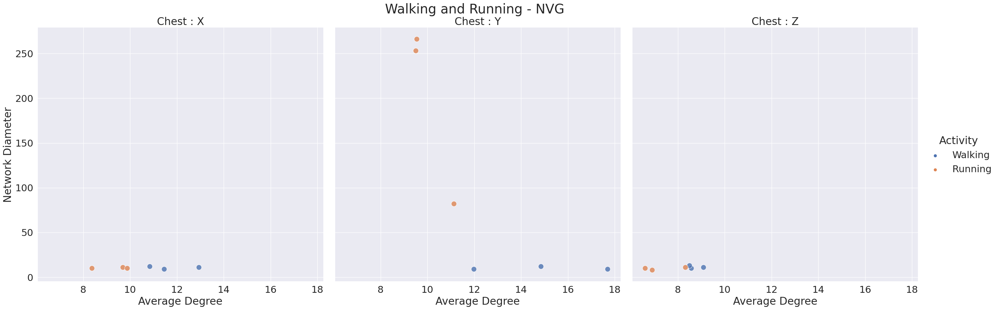

In [12]:
#This is the table for walking and running for the method NVG, where we take out the activity walking and running from the dataset output
walking_running = Output_Table[((Output_Table['Activity'] == 'Walking') | (Output_Table['Activity'] == 'Running')) & (Output_Table['Method'] == 'NVG')]
#This code uses the Seaborn library to create a scatter plot with multiple facets (subplots) based on the values of certain variables.
#The "sns.set" function is used to set the font size for the plot.
#The resulting plot will show a scatter plot for each combination of 'Body Part' and 'Accelerometer Axis' in separate subplots. 
#Each subplot will have x-axis values from the 'Average Degree' column and y-axis values from the 'Network Diameter' column. 
#The data points will be colored based on the 'Activity' column. The title for each subplot will be "{row_name} : {col_name}" where "{row_name}" and "{col_name}" are the values of the 'Body Part' and 'Accelerometer Axis' variables, respectively.
sns.set(font_scale = 2)
g1 = sns.relplot(data = walking_running, x = 'Average Degree', y = 'Network Diameter', hue = 'Activity', row = 'Body Part', col = 'Accelerometer Axis', height = 10, aspect = 1, alpha = 0.8, s = 150)
g1.set_titles('{row_name} : {col_name}')
g1.fig.suptitle('Walking and Running - NVG', x = 0.48, y = 1.008, fontsize = 30)

Text(0.48, 1.008, 'Walking and Running - HVG')

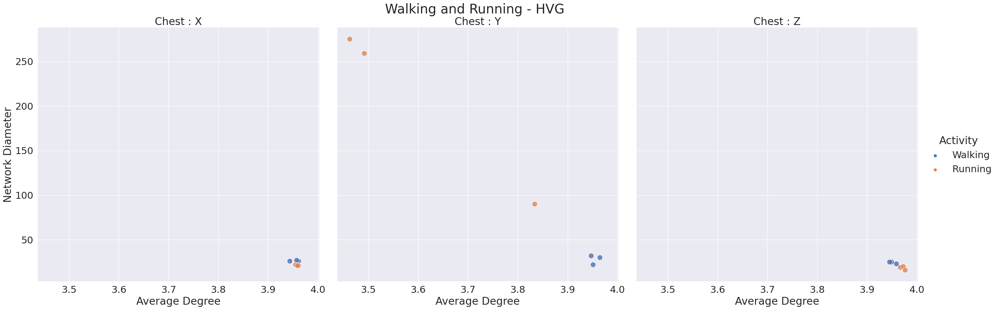

In [13]:
#This is the table for walking and running for the method NVG, where we take out the activity walking and running from the dataset output
walking_running = Output_Table[((Output_Table['Activity'] == 'Walking') | (Output_Table['Activity'] == 'Running')) & (Output_Table['Method'] == 'HVG')]
sns.set(font_scale = 2)
g2 = sns.relplot(data = walking_running, x = 'Average Degree', y = 'Network Diameter', hue = 'Activity', row = 'Body Part', col = 'Accelerometer Axis', height = 10, aspect = 1, alpha = 0.8, s = 150)
g2.set_titles('{row_name} : {col_name}')
g2.fig.suptitle('Walking and Running - HVG', x = 0.48, y = 1.008, fontsize = 30)

Text(0.48, 1.008, 'Climbing Up and Climbing Down - NVG')

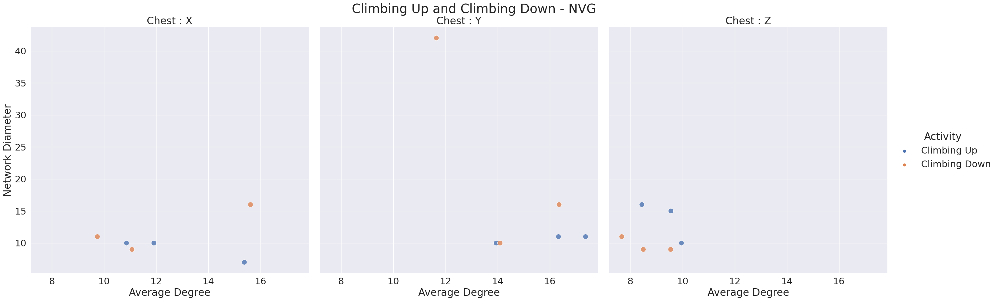

In [14]:
climbingup_climbingdown = Output_Table[((Output_Table['Activity'] == 'Climbing Up') | (Output_Table['Activity'] == 'Climbing Down')) & (Output_Table['Method'] == 'NVG')]
sns.set(font_scale = 2)
g3 = sns.relplot(data = climbingup_climbingdown, x = 'Average Degree', y = 'Network Diameter', hue = 'Activity', row = 'Body Part', col = 'Accelerometer Axis', height = 10, aspect = 1, alpha = 0.8, s = 150)
g3.set_titles('{row_name} : {col_name}')
g3.fig.suptitle('Climbing Up and Climbing Down - NVG', x = 0.48, y = 1.008, fontsize = 30)

Text(0.48, 1.008, 'Climbing Up and Climbing Down - HVG')

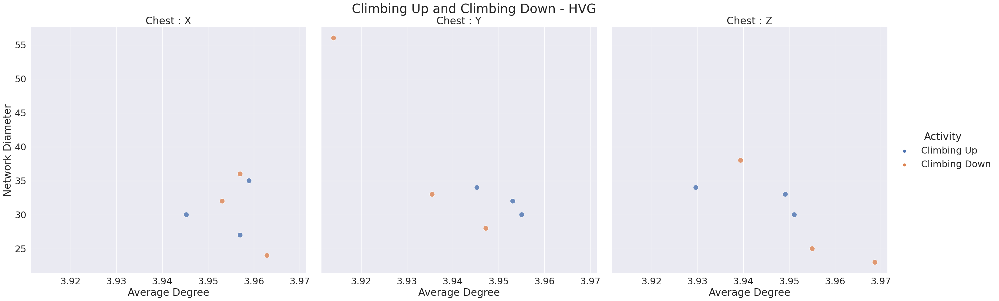

In [15]:
climbingup_climbingdown = Output_Table[((Output_Table['Activity'] == 'Climbing Up') | (Output_Table['Activity'] == 'Climbing Down')) & (Output_Table['Method'] == 'HVG')]
sns.set(font_scale = 2)
g4 = sns.relplot(data = climbingup_climbingdown, x = 'Average Degree', y = 'Network Diameter', hue = 'Activity', row = 'Body Part', col = 'Accelerometer Axis', height = 10, aspect = 1, alpha = 0.8, s = 150)
g4.set_titles('{row_name} : {col_name}')
g4.fig.suptitle('Climbing Up and Climbing Down - HVG', x = 0.48, y = 1.008, fontsize = 30)

# Task 2
<div class="alert alert-block alert-info">
    <b>Google has made available some `mobility data around the world since the COVID-19 pandemic began`. You can find their datasets [here](https://www.google.com/covid19/mobility). For this task, you will be forecasting using data from the `King County`. There are 2 ways to get these data: </b>

    
    <a> href="https://www.google.com" >Link to Google</a>
    <a> href="https://www.google.com/covid19/mobility" >here</a>
    
1. Download the Global file (not recommended, it’s huge) 
2. Download the folder of all Regional files. There should be 3 years of CSV files for each region, you should locate and grab the 3 corresponding to “US”

Once you have the proper data files, you should be able to isolate just the data from King county via the `sub_region_#` columns. In this activity, we will be concerned with describing and forecasting the time series concerning `“Residential”, “Work”, and “Grocery and Pharmacy”` 
1. Put together your entire time series using all the data from `2020-2022`. You should end up with 1 dataframe that contains all the data points. 
2. Trim down your time series to remove the months before April 2020. This will remove the very early pandemic and the pre-pandemic conditions. 
3. For each of the 3 time series, perform an additive Time Series Decomposition and plot the results. You should show the trend, seasonality, and remainder in your plots. 
4. For each time series, build a forecasting model using Exponential Smoothing (ES). You should test out at least 2 different ES models and use forecast evaluation metrics (e.g. MAE, RMSE) to demonstrate why you chose your best ES model 
5. For each time series, build a forecasting model using ARIMA. You must show why you chose your ARIMA model. 
6. Compare your best ES and best ARIMA models for each time series using forecast evaluation metrics. Show which model is best in each case. 
7. Using your best model, forecast the rest of 2022 for each time series. Show these forecasts by plotting the past data points in 1 color and the future data points in a second color.

</div>

 - Data Update Info:  
The Community Mobility Reports are no longer being updated as of 2022-10-15.   
All historical data will remain publicly available.

--------

# Start step1 and step2
1. Put together your entire time series using all the data from 2020-2022. You should end up with 1 dataframe that contains all the data points.
2. Trim down your time series to remove the months before April 2020. This will remove the very early pandemic and the pre-pandemic conditions.

In [ ]:
df0 = pd.read_csv('2020_US_Region_Mobility_Report.csv')
df1 = pd.read_csv('2021_US_Region_Mobility_Report.csv')
df2 = pd.read_csv('2022_US_Region_Mobility_Report.csv')

df = pd.concat([df0, df1, df2])

In [ ]:
df.head()

,country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,place_id,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
0,US,United States,NaN,NaN,NaN,NaN,NaN,ChIJCzYy5IS16lQRQrfeQ5K5Oxw,2020-02-15,6.0,2.0,15.0,3.0,2.0,-1.0
1,US,United States,NaN,NaN,NaN,NaN,NaN,ChIJCzYy5IS16lQRQrfeQ5K5Oxw,2020-02-16,7.0,1.0,16.0,2.0,0.0,-1.0
2,US,United States,NaN,NaN,NaN,NaN,NaN,ChIJCzYy5IS16lQRQrfeQ5K5Oxw,2020-02-17,6.0,0.0,28.0,-9.0,-24.0,5.0
3,US,United States,NaN,NaN,NaN,NaN,NaN,ChIJCzYy5IS16lQRQrfeQ5K5Oxw,2020-02-18,0.0,-1.0,6.0,1.0,0.0,1.0
4,US,United States,NaN,NaN,NaN,NaN,NaN,ChIJCzYy5IS16lQRQrfeQ5K5Oxw,2020-02-19,2.0,0.0,8.0,1.0,1.0,0.0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2511994 entries, 0 to 747968
Data columns (total 15 columns):
 #   Column                                              Dtype  
---  ------                                              -----  
 0   country_region_code                                 object 
 1   country_region                                      object 
 2   sub_region_1                                        object 
 3   sub_region_2                                        object 
 4   metro_area                                          float64
 5   iso_3166_2_code                                     object 
 6   census_fips_code                                    float64
 7   place_id                                            object 
 8   date                                                object 
 9   retail_and_recreation_percent_change_from_baseline  float64
 10  grocery_and_pharmacy_percent_change_from_baseline   float64
 11  parks_percent_change_from_baseline    

In [ ]:
# find "King County"
df.sub_region_1.unique()

array([nan, 'Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California',
       'Colorado', 'Connecticut', 'Delaware', 'District of Columbia',
       'Florida', 'Georgia', 'Hawaii', 'Idaho', 'Illinois', 'Indiana',
       'Iowa', 'Kansas', 'Kentucky', 'Louisiana', 'Maine', 'Maryland',
       'Massachusetts', 'Michigan', 'Minnesota', 'Mississippi',
       'Missouri', 'Montana', 'Nebraska', 'Nevada', 'New Hampshire',
       'New Jersey', 'New Mexico', 'New York', 'North Carolina',
       'North Dakota', 'Ohio', 'Oklahoma', 'Oregon', 'Pennsylvania',
       'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee',
       'Texas', 'Utah', 'Vermont', 'Virginia', 'Washington',
       'West Virginia', 'Wisconsin', 'Wyoming'], dtype=object)

In [ ]:
# find "King County"
sub_region_2 = df.sub_region_2.unique()
print(sub_region_2)
print(len(sub_region_2))

[nan 'Autauga County' 'Baldwin County' ... 'Washakie County'
 'Weston County' 'Nome']
1719


In [ ]:
# find "King County"
pattern = re.compile(r'^[K][ing][\s\w]*ty$', re.I)

unique_string = []
whole_list = sub_region_2.tolist()
whole_list = list(dict.fromkeys(whole_list))

for string in whole_list:
    if str(string) != 'nan' and re.match(pattern, string):
        unique_string.append(string)
print(unique_string)
print(len(unique_string))

['Kings County', 'Kiowa County', 'Kit Carson County', 'Knox County', 'Kingman County', 'Knott County', 'Kimball County', 'Kingfisher County', 'Kingsbury County', 'Kimble County', 'King and Queen County', 'King George County', 'King William County', 'King County', 'Kitsap County', 'Kittitas County']
16


In [ ]:
# filter "King County"
df = df[df['sub_region_2'] == 'King County']
df.shape

(974, 15)

In [ ]:
# “Residential”, “Work”, and “Grocery and Pharmacy”
# rename col
df = df.rename(columns={"residential_percent_change_from_baseline": "residential", 
                   "workplaces_percent_change_from_baseline": "workplaces",
                  "grocery_and_pharmacy_percent_change_from_baseline": "grocery_and_pharmacy"})
# select col
df = df[["date", "residential", "workplaces", "grocery_and_pharmacy"]]
df.shape

(974, 4)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 974 entries, 765150 to 704849
Data columns (total 4 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   date                  974 non-null    object 
 1   residential           974 non-null    float64
 2   workplaces            974 non-null    float64
 3   grocery_and_pharmacy  974 non-null    float64
dtypes: float64(3), object(1)
memory usage: 38.0+ KB


In [ ]:
# convert data type
df["date"] = pd.to_datetime(df["date"], format="%Y-%m-%d")

# date range
print(max(df["date"]),min(df["date"]))
print(max(df["date"])-min(df["date"]))

# Trim down your time series to remove the months before April 2020
df = df[df['date'] >= '2020-04-01']

# date range
print(max(df["date"]),min(df["date"]))
print(max(df["date"])-min(df["date"]))

print(df.shape)

df.info()
df.head()

2022-10-15 00:00:00 2020-02-15 00:00:00
973 days 00:00:00
2022-10-15 00:00:00 2020-04-01 00:00:00
927 days 00:00:00
(928, 4)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 928 entries, 765196 to 704849
Data columns (total 4 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   date                  928 non-null    datetime64[ns]
 1   residential           928 non-null    float64       
 2   workplaces            928 non-null    float64       
 3   grocery_and_pharmacy  928 non-null    float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 36.2 KB


,date,residential,workplaces,grocery_and_pharmacy
765196,2020-04-01,29.0,-70.0,-20.0
765197,2020-04-02,30.0,-70.0,-22.0
765198,2020-04-03,31.0,-69.0,-21.0
765199,2020-04-04,17.0,-48.0,-24.0
765200,2020-04-05,15.0,-48.0,-29.0


In [ ]:
# set index
df = pd.DataFrame(df).set_index("date")

df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 928 entries, 2020-04-01 to 2022-10-15
Data columns (total 3 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   residential           928 non-null    float64
 1   workplaces            928 non-null    float64
 2   grocery_and_pharmacy  928 non-null    float64
dtypes: float64(3)
memory usage: 29.0 KB


,residential,workplaces,grocery_and_pharmacy
date,,,
2020-04-01,29.0,-70.0,-20.0
2020-04-02,30.0,-70.0,-22.0
2020-04-03,31.0,-69.0,-21.0
2020-04-04,17.0,-48.0,-24.0
2020-04-05,15.0,-48.0,-29.0


In [ ]:
# this is the dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 928 entries, 2020-04-01 to 2022-10-15
Data columns (total 3 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   residential           928 non-null    float64
 1   workplaces            928 non-null    float64
 2   grocery_and_pharmacy  928 non-null    float64
dtypes: float64(3)
memory usage: 29.0 KB


In [ ]:
df.head()

,residential,workplaces,grocery_and_pharmacy
date,,,
2020-04-01,29.0,-70.0,-20.0
2020-04-02,30.0,-70.0,-22.0
2020-04-03,31.0,-69.0,-21.0
2020-04-04,17.0,-48.0,-24.0
2020-04-05,15.0,-48.0,-29.0


In [ ]:
report = ProfileReport(df)
report.to_file('report.html')
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### we can see from the above that residential and workplace are highly correlated

------------------

# Start step 3
3. For each of the 3 time series, perform an additive Time Series Decomposition and plot the results. You should show the trend, seasonality, and remainder in your plots. 

In [ ]:
# Let's put the data at a monthly cadence and fill in missing values
dfm = df.resample('M').mean().ffill()
dfm

,residential,workplaces,grocery_and_pharmacy
date,,,
2020-04-30,24.566667,-62.166667,-22.166667
2020-05-31,20.451613,-53.354839,-15.806452
2020-06-30,17.100000,-47.233333,-12.500000
2020-07-31,14.612903,-47.645161,-10.096774
2020-08-31,12.935484,-44.322581,-11.838710
2020-09-30,14.966667,-45.366667,-14.066667
2020-10-31,14.967742,-41.290323,-14.419355
2020-11-30,17.366667,-44.333333,-18.133333
2020-12-31,18.064516,-47.516129,-15.580645


In [ ]:
# Let's put the data at a weekly cadence and fill in missing values
dfw = df.resample('W').mean()
dfw

,residential,workplaces,grocery_and_pharmacy
date,,,
2020-04-05,24.400000,-61.000000,-23.200000
2020-04-12,24.857143,-63.714286,-21.285714
2020-04-19,24.428571,-61.142857,-22.000000
2020-04-26,24.428571,-60.428571,-23.714286
2020-05-03,22.000000,-58.714286,-19.714286
...,...,...,...
2022-09-18,6.142857,-35.285714,-9.285714
2022-09-25,6.285714,-35.285714,-9.285714
2022-10-02,6.285714,-34.285714,-9.428571


In [ ]:
dfw.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 133 entries, 2020-04-05 to 2022-10-16
Freq: W-SUN
Data columns (total 3 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   residential           133 non-null    float64
 1   workplaces            133 non-null    float64
 2   grocery_and_pharmacy  133 non-null    float64
dtypes: float64(3)
memory usage: 4.2 KB


In [ ]:
def dcp(data: pd.DataFrame, col_name: str):
    res = sm.tsa.seasonal_decompose(data[col_name], "additive")
    fig = res.plot()
    fig.set_size_inches(20,5)
    plt.show()

In [ ]:
df["date"] = df.index

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 928 entries, 2020-04-01 to 2022-10-15
Data columns (total 4 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   residential           928 non-null    float64       
 1   workplaces            928 non-null    float64       
 2   grocery_and_pharmacy  928 non-null    float64       
 3   date                  928 non-null    datetime64[ns]
dtypes: datetime64[ns](1), float64(3)
memory usage: 36.2 KB


In [ ]:
dw_mapping={
    0: 'Mon', 
    1: 'Tues', 
    2: 'Wed', 
    3: 'Thur', 
    4: 'Fri',
    5: 'Sat', 
    6: 'Sun'
} 
df['day_of_week_name']=df["date"].dt.weekday.map(dw_mapping)
df

,residential,workplaces,grocery_and_pharmacy,date,day_of_week_name
date,,,,,
2020-04-01,29.0,-70.0,-20.0,2020-04-01,Wed
2020-04-02,30.0,-70.0,-22.0,2020-04-02,Thur
2020-04-03,31.0,-69.0,-21.0,2020-04-03,Fri
2020-04-04,17.0,-48.0,-24.0,2020-04-04,Sat
2020-04-05,15.0,-48.0,-29.0,2020-04-05,Sun
...,...,...,...,...,...
2022-10-11,9.0,-40.0,-10.0,2022-10-11,Tues
2022-10-12,9.0,-41.0,-10.0,2022-10-12,Wed
2022-10-13,9.0,-41.0,-10.0,2022-10-13,Thur


In [ ]:
df_Residential = df['2020-04-01':'2022-12-31'].resample('D').sum()
df_Residential.head()


,residential,workplaces,grocery_and_pharmacy
date,,,
2020-04-01,29.0,-70.0,-20.0
2020-04-02,30.0,-70.0,-22.0
2020-04-03,31.0,-69.0,-21.0
2020-04-04,17.0,-48.0,-24.0
2020-04-05,15.0,-48.0,-29.0


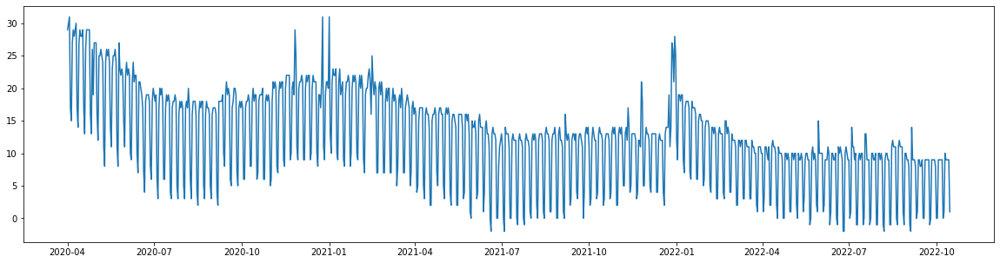

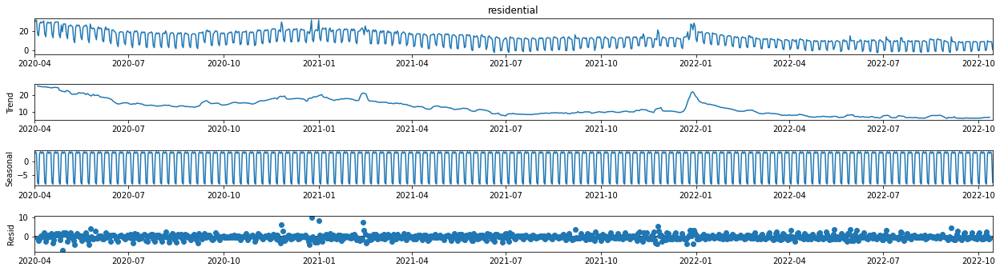

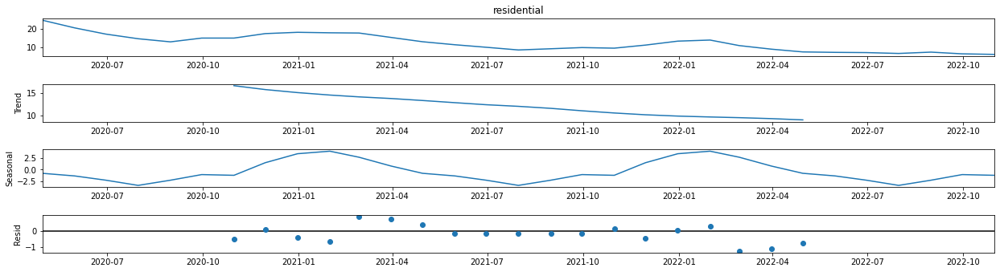

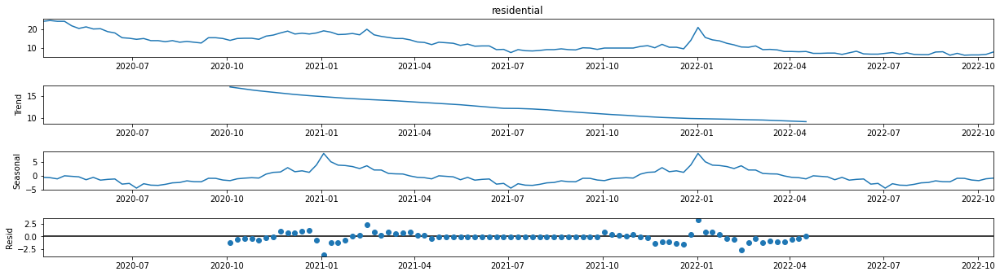

In [ ]:
# 1. residential
plt.figure(figsize=(20,5))
plt.plot(df.index, df["residential"])
plt.show()

# this is whole data
dcp(df, "residential")

# this is monthly data, seasonal shows it goes up to peak on Jan and down to bottom on Aug
dcp(dfm, "residential")

# this is monthly data, seasonal shows it goes up to peak on Jan and down to bottom on Aug
dcp(dfw, "residential")

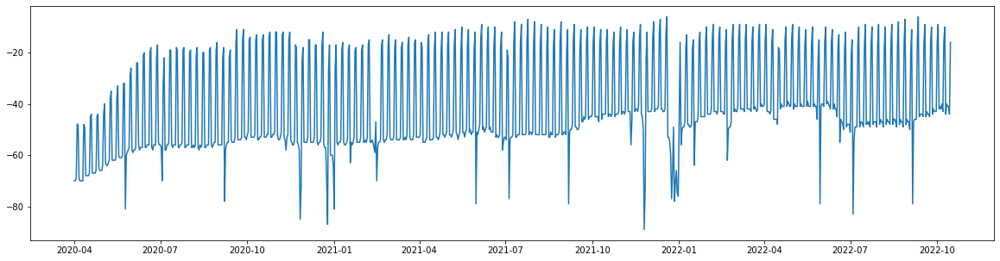

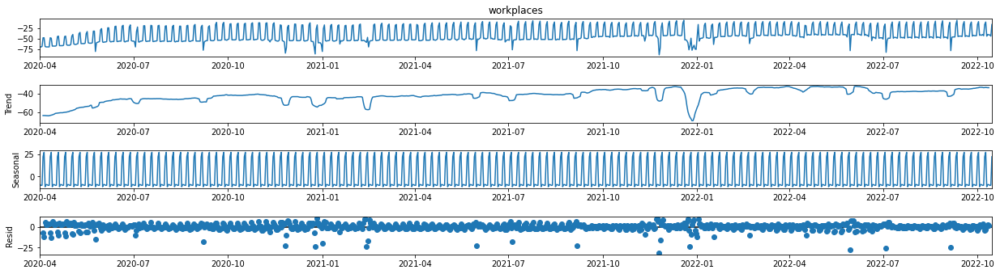

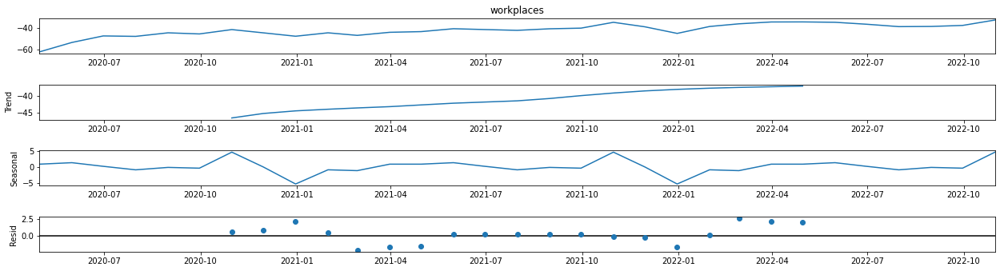

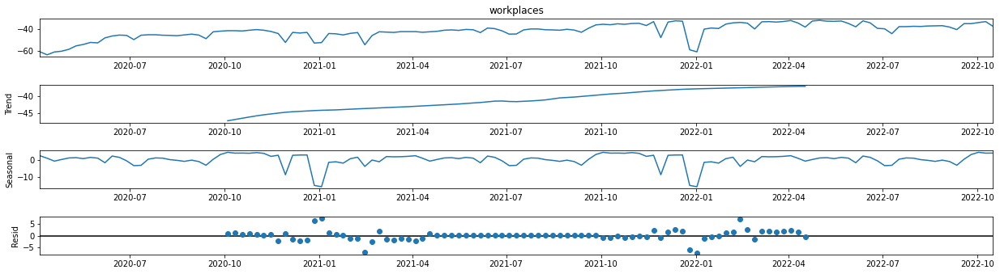

In [ ]:
# 2. workplaces
plt.figure(figsize=(20,5))
plt.plot(df.index, df["workplaces"])
plt.show()

# this is whole data
dcp(df, "workplaces")

# this is monthly data, seasonal shows it goes up to peak on Jan and down to bottom on Aug
dcp(dfm, "workplaces")

# this is monthly data, seasonal shows it goes up to peak on Jan and down to bottom on Aug
dcp(dfw, "workplaces")

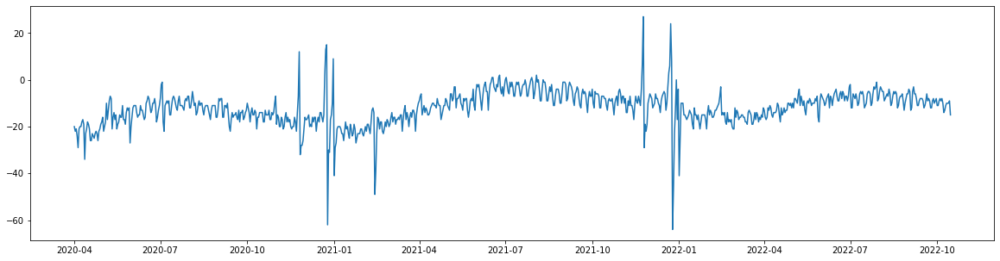

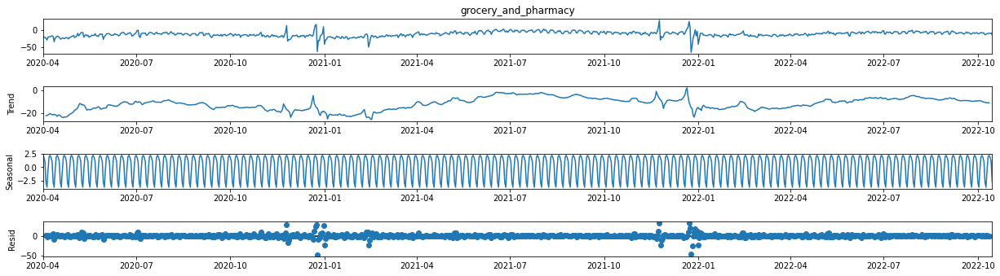

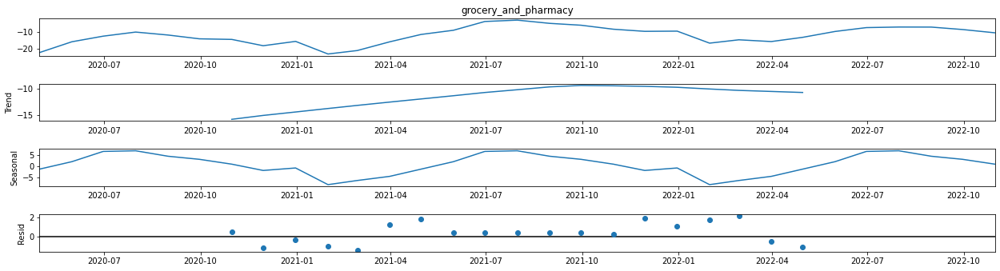

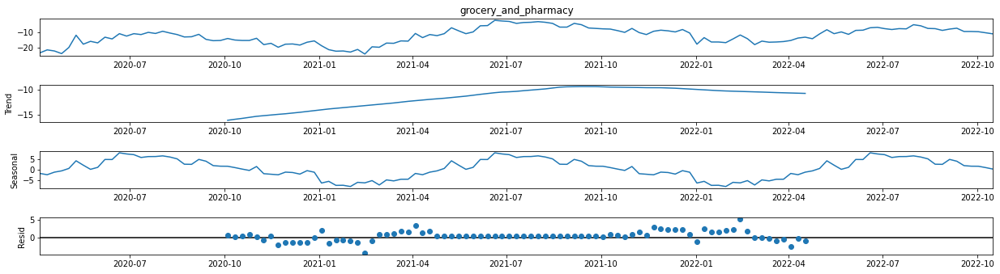

In [ ]:
# 3. grocery_and_pharmacy
plt.figure(figsize=(20,5))
plt.plot(df.index, df["grocery_and_pharmacy"])
plt.show()

# this is whole data
dcp(df, "grocery_and_pharmacy")

# this is monthly data, seasonal shows it goes up to peak on Jan and down to bottom on Aug
dcp(dfm, "grocery_and_pharmacy")

# this is monthly data, seasonal shows it goes up to peak on Jan and down to bottom on Aug
dcp(dfw, "grocery_and_pharmacy")

### From visual inspection, there's a weekly and yearly seasonality.

------

# Start step 4-7 
4. For each time series, build a forecasting model using Exponential Smoothing (ES). You should test out at least 2 different ES models and use forecast evaluation metrics (e.g. MAE, RMSE) to demonstrate why you chose your best ES model 
5. For each time series, build a forecasting model using ARIMA. You must show why you chose your ARIMA model.
6. Compare your best ES and best ARIMA models for each time series using forecast evaluation metrics. Show which model is best in each case.
7. Using your best model, forecast the rest of 2022 for each time series. Show these forecasts by plotting the past data points in 1 color and the future data points in a second color.

In [ ]:
df_training = df.loc[:"2021-09-30"]
df_test = df.loc["2021-10-01":]

print(df_training.tail())
print(df_test.head())


            residential  workplaces  grocery_and_pharmacy       date  \
date                                                                   
2021-09-26          4.0       -10.0                 -14.0 2021-09-26   
2021-09-27         13.0       -46.0                  -8.0 2021-09-27   
2021-09-28         14.0       -45.0                  -5.0 2021-09-28   
2021-09-29         13.0       -45.0                  -7.0 2021-09-29   
2021-09-30         14.0       -45.0                  -7.0 2021-09-30   

           day_of_week_name  
date                         
2021-09-26              Sun  
2021-09-27              Mon  
2021-09-28             Tues  
2021-09-29              Wed  
2021-09-30             Thur  
            residential  workplaces  grocery_and_pharmacy       date  \
date                                                                   
2021-10-01         11.0       -44.0                  -4.0 2021-10-01   
2021-10-02          2.0       -16.0                 -10.0 2021-10-02 

In [ ]:
print(max(df_test.index)-min(df_test.index))

379 days 00:00:00


In [ ]:
n = 380

In [ ]:
# run fucntions
warnings.filterwarnings("ignore")
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_absolute_error, mean_squared_error
# A little custom function for scoring multile metrics on multiple time series
def score_all_metrics(data: pd.DataFrame, var: str, col_names: list):
    """Score a set of predictions on all metrics"""

    mae = []
    rmse = []

    for col in col_names:
        mae.append(mean_absolute_error(data[var], data[col]))
        rmse.append(mean_squared_error(data[var], data[col], squared=False))

    results_df = pd.DataFrame({
        "ModelName": col_names,
        "MAE": mae,
        "RMSE": rmse
    })

    return results_df

from statsmodels.tsa.holtwinters import ExponentialSmoothing

def fit_model(df_training: pd.DataFrame, df_test: pd.DataFrame, var: str):
    
    # Trend only
    trend_es = ExponentialSmoothing(df_training[var], trend="add")

    # Dampened trend
    dampened_es = ExponentialSmoothing(df_training[var], trend="add", damped_trend=True)

    # Seasonal + Trend + Dampened trend
    seasonal_es = ExponentialSmoothing(df_training[var], trend="add", seasonal="add", damped_trend=True, seasonal_periods=52, initialization_method="estimated")

    # Simple
    simple_es = SimpleExpSmoothing(df_training[var])

    # Add the values for each model
    df_training["TrendES"] = trend_es.fit().fittedvalues
    df_training["DampenedES"] = dampened_es.fit().fittedvalues
    df_training["SeasonalES"] = seasonal_es.fit().fittedvalues
    df_training["SimpleES"] = simple_es.fit().fittedvalues
    
    df_plot = df_training[[var,'SimpleES','TrendES','DampenedES','SeasonalES']]
    df_plot.plot(figsize=(15,10))
    plt.show()
    
    # test
    df_test["SimpleES"] = simple_es.fit().forecast(n)
    df_test["TrendES"] = trend_es.fit().forecast(n)
    df_test["DampenedES"] = dampened_es.fit().forecast(n)
    df_test["SeasonalES"] = seasonal_es.fit().forecast(n)

    df_plot = df_test[[var,'SimpleES','TrendES','DampenedES','SeasonalES']]
    df_plot.plot(figsize=(12,10))
    plt.show()


## 1. residential

### ES

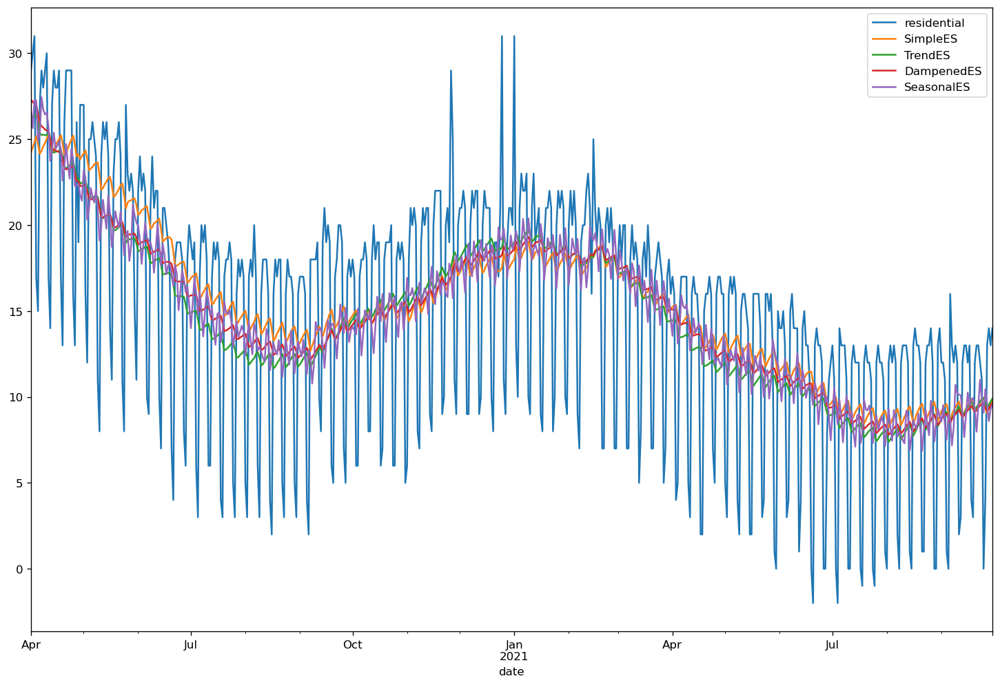

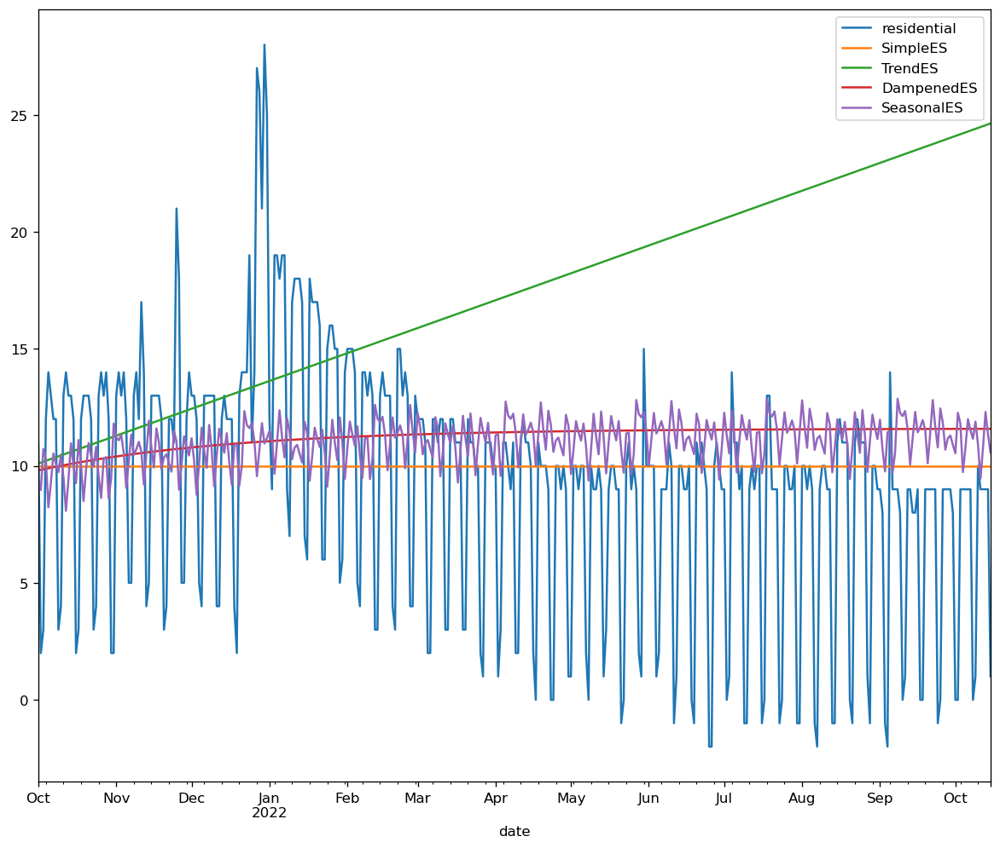

,ModelName,MAE,RMSE
0,SimpleES,3.969333,5.435681
1,TrendES,9.420068,11.465680
2,DampenedES,4.425302,5.892973
3,SeasonalES,4.435973,5.844278


In [ ]:
# 1. 
fit_model(df_training, df_test, "residential")

exp_smooth_scores = score_all_metrics(df_test, "residential", ["SimpleES","TrendES","DampenedES","SeasonalES"])

cm = sns.color_palette("vlag", as_cmap=True)
exp_smooth_scores.style.background_gradient(cmap=cm)

### I think SeasonalES is best ES model though SimpleES has the lowest errors, because by plotting SeasonalES is better with waves.


--------

### ARIMA

In [ ]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(df['residential'])
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
  print('\t%s: %.3f' % (key, value))

ADF Statistic: -2.585378
p-value: 0.096057
Critical Values:
	1%: -3.438
	5%: -2.865
	10%: -2.568


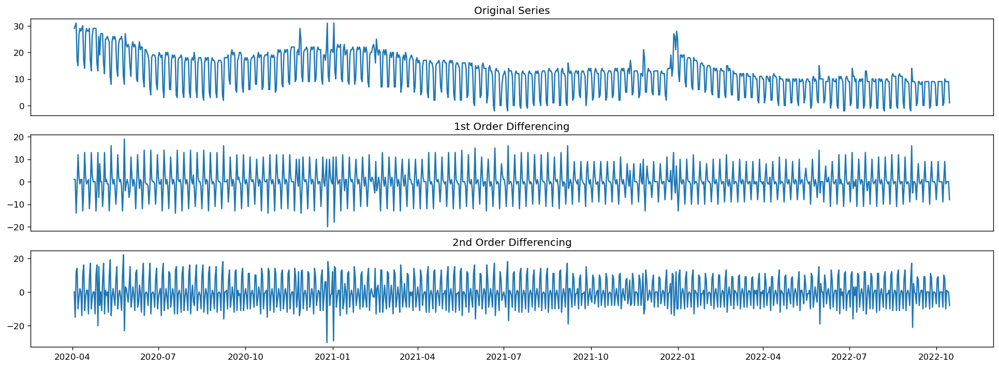

In [ ]:
# d=1
plt.rcParams.update({'figure.figsize':(20,7), 'figure.dpi':120})
# Original Series
fig, (ax1, ax2, ax3) = plt.subplots(3)
ax1.plot(df.residential); ax1.set_title('Original Series'); ax1.axes.xaxis.set_visible(False)
# 1st Differencing
ax2.plot(df.residential.diff()); ax2.set_title('1st Order Differencing'); ax2.axes.xaxis.set_visible(False)
# 2nd Differencing
ax3.plot(df.residential.diff().diff()); ax3.set_title('2nd Order Differencing')
plt.show()

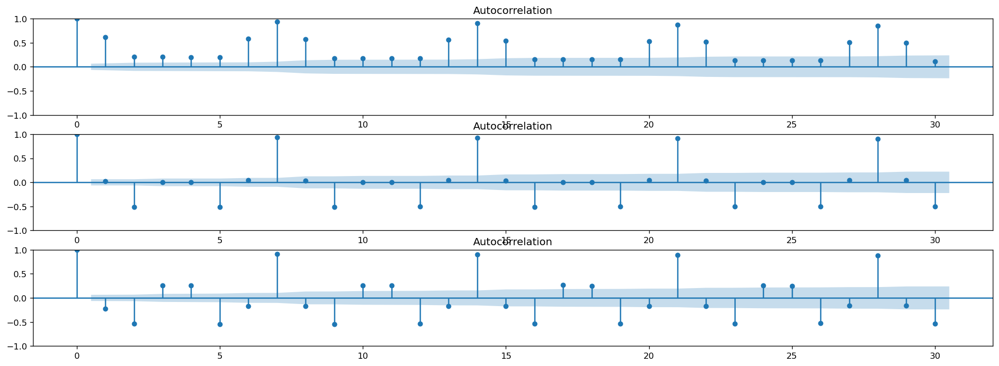

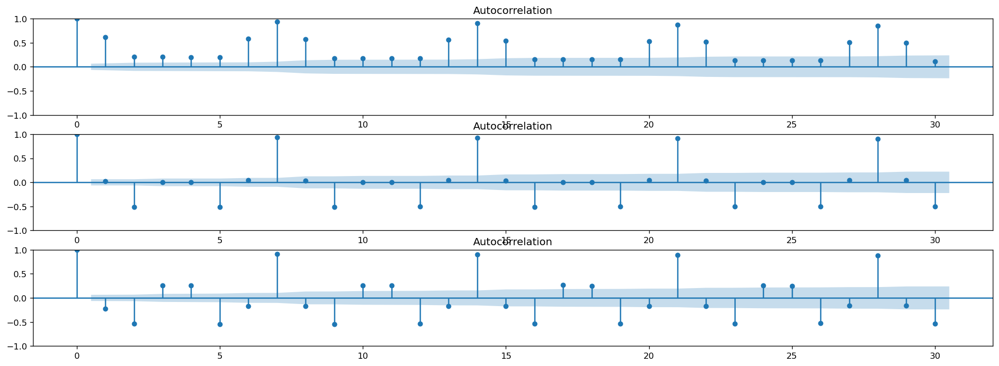

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
fig, (ax1, ax2, ax3) = plt.subplots(3)
plot_acf(df.residential, ax=ax1)
plot_acf(df.residential.diff().dropna(), ax=ax2)
plot_acf(df.residential.diff().diff().dropna(), ax=ax3)

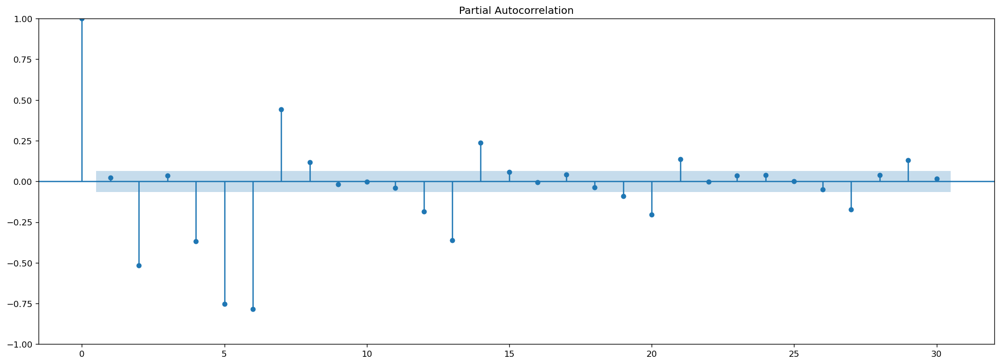

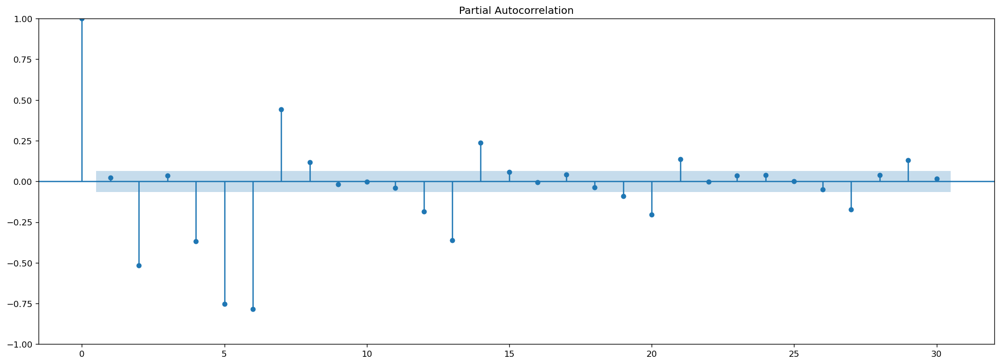

In [ ]:
from statsmodels.graphics.tsaplots import plot_pacf
# p=1
plot_pacf(df.residential.diff().dropna())


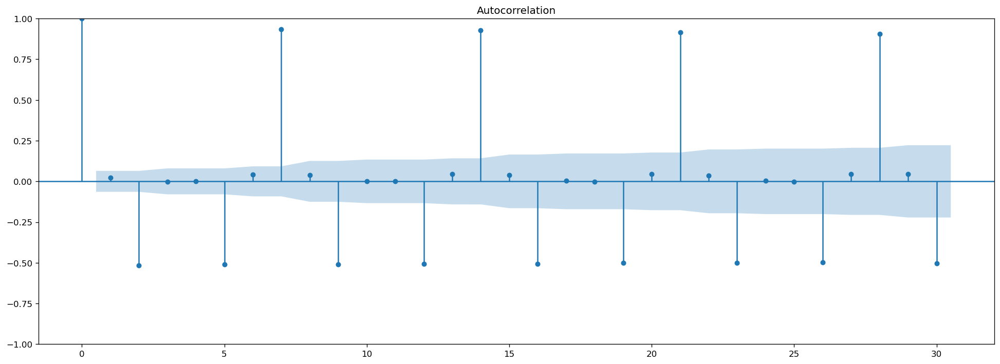

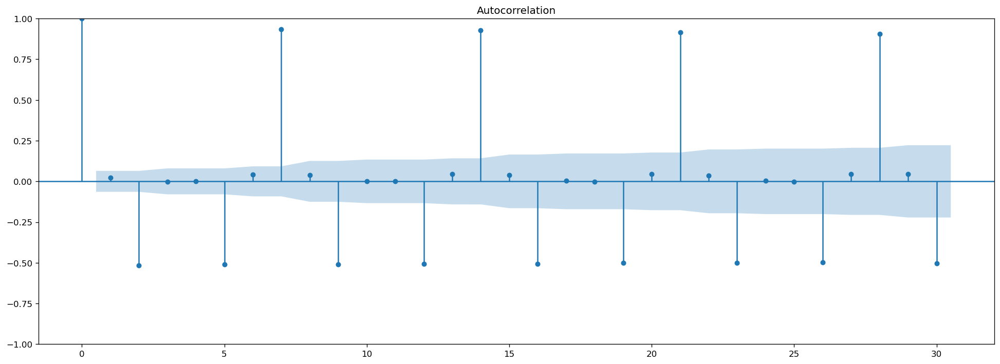

In [ ]:
# q=1
plot_acf(df.residential.diff().dropna())

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from pmdarima.arima import auto_arima

# AR(1)
ar_1 = ARIMA(df_training["residential"], order=(1,0,0))

# MA(1)
ma_1 = ARIMA(df_training["residential"], order=(0,0,1))

# ARIMA(1,1,1)
arima_1 = ARIMA(df_training["residential"], order=(1,1,1))

# S-ARIMA (1,1,1)(1,1,1,52)
sarima = ARIMA(df_training["residential"], order=(1,1,1), seasonal_order=(1,1,1,52))

# Add the values for each model
df_training["AR(1)"] = ar_1.fit().fittedvalues
df_training["MA(1)"] = ma_1.fit().fittedvalues
df_training["ARIMA(1,1,1)"] = arima_1.fit().fittedvalues
df_training["SARIMA(1,1,1)"] = sarima.fit().fittedvalues


df_test["AR(1)"] = ar_1.fit().forecast(n)
df_test["MA(1)"] = ma_1.fit().forecast(n)
df_test["ARIMA(1,1,1)"] = arima_1.fit().forecast(n)
df_test["SARIMA(1,1,1)"] = sarima.fit().forecast(n)



KeyboardInterrupt: 

In [ ]:
arima_scores = score_all_metrics(df_test, "residential", ["AR(1)","MA(1)","ARIMA(1,1,1)","SARIMA(1,1,1)","SARIMAX(1,1,1)"])

cm = sns.color_palette("vlag", as_cmap=True)
arima_scores.style.background_gradient(cmap=cm)

,ModelName,MAE,RMSE
0,AR(1),6.405329,7.898521
1,MA(1),6.400350,7.892788
2,"ARIMA(1,1,1)",6.405329,7.898521
3,"SARIMA(1,1,1)",5.854601,6.642057
4,"SARIMAX(1,1,1)",5.035294,6.170561


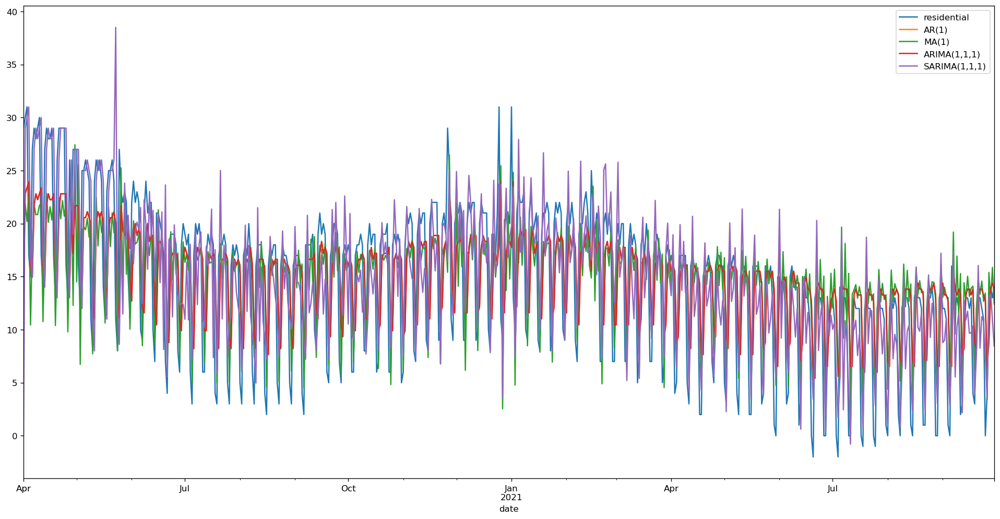

In [ ]:
df_training[["residential","AR(1)","MA(1)","ARIMA(1,1,1)","SARIMA(1,1,1)"]].plot(figsize=(20,10))
plt.show()

df_test[["residential","AR(1)","MA(1)","ARIMA(1,1,1)","SARIMA(1,1,1)"]].plot(figsize=(12,10))
plt.show()

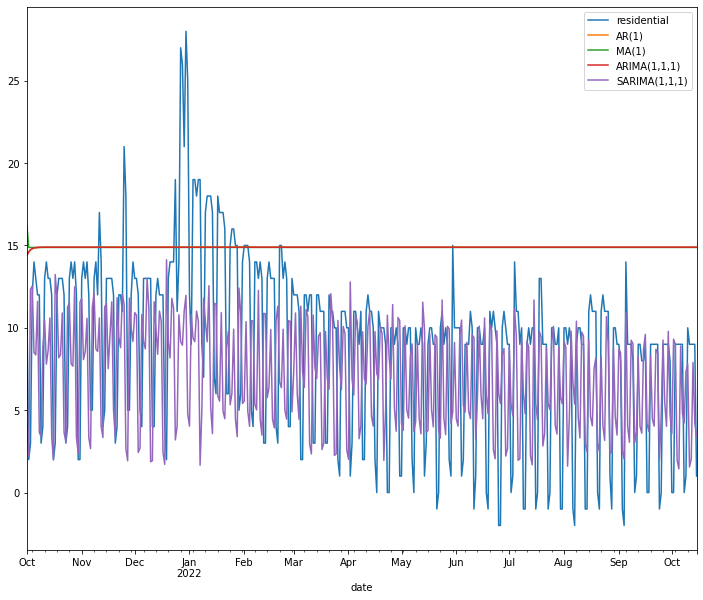

In [ ]:
df_test[["residential","AR(1)","MA(1)","ARIMA(1,1,1)","SARIMA(1,1,1)"]].plot(figsize=(12,10))
plt.show()

### seasonal ARIMA is the best fit in ARIMA.

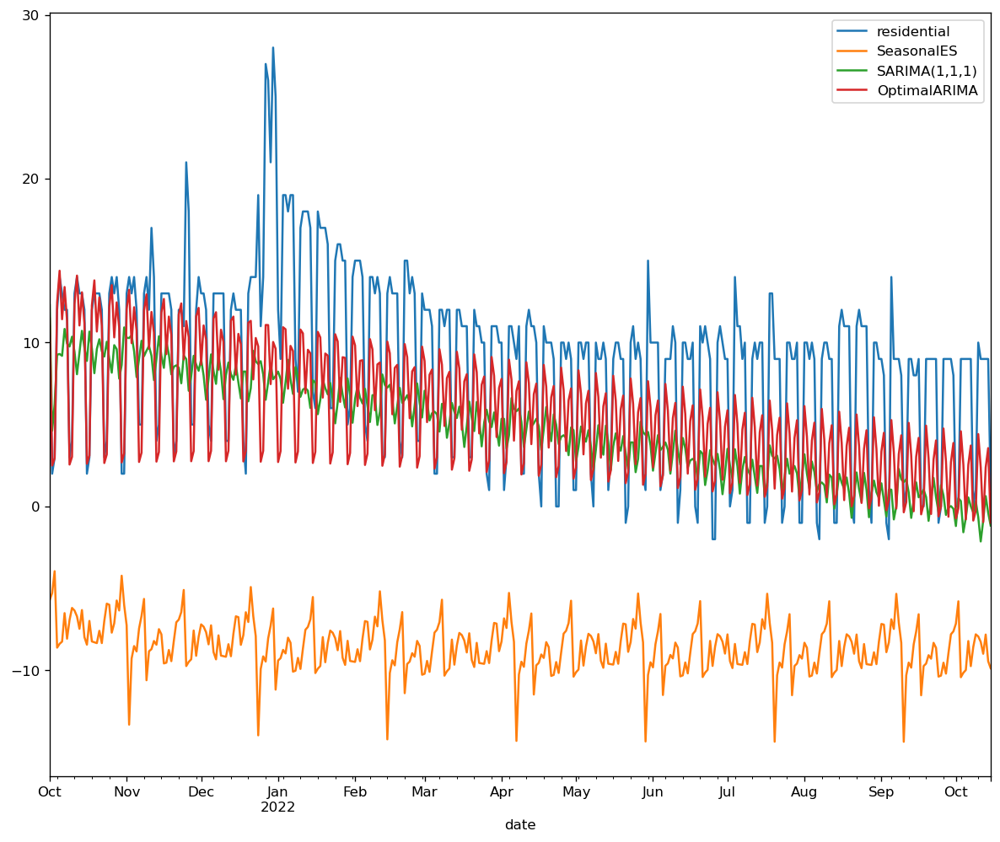

In [ ]:
# auto_arima breaks down my computer. So chose the above d p q in comparision
from pmdarima.arima import auto_arima
fit_model = auto_arima(df_training["residential"])
fit_model.get_params()
df_test["OptimalARIMA"] = fit_model.predict(n)
df_test[["residential","SeasonalES","SARIMA(1,1,1)", "OptimalARIMA"]].plot(figsize=(12,10))
plt.show()

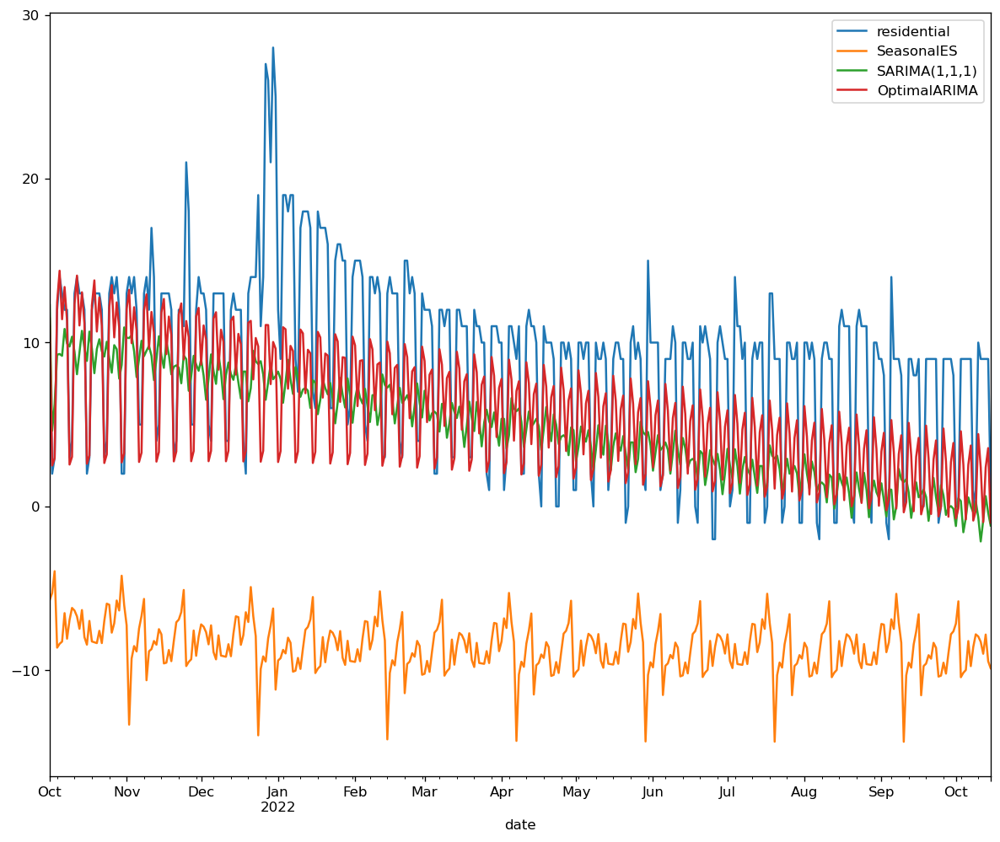

In [ ]:
df_test["OptimalARIMA"] = fit_model.predict(n)

df_test[["residential","SeasonalES","SARIMA(1,1,1)", "OptimalARIMA"]].plot(figsize=(12,10))
plt.show()

In [ ]:
final_compare = score_all_metrics(df_test, "residential", ["SeasonalES","SARIMA(1,1,1)", "OptimalARIMA"])

cm = sns.color_palette("vlag", as_cmap=True)
final_compare.style.background_gradient(cmap=cm)

,ModelName,MAE,RMSE
0,SeasonalES,17.630260,18.487954
1,"SARIMA(1,1,1)",5.854601,6.642057
2,OptimalARIMA,3.817241,4.876076


### OptimalARIMA in the best fit in all models tested.

In [ ]:
print(max(df.index))

2022-10-15 00:00:00


In [ ]:
m=78

In [ ]:
df_test["OptimalARIMA"] = fit_model.predict(m)

df_test[["residential","OptimalARIMA"]].plot(figsize=(12,10))
plt.show()

------

## 2. workplaces

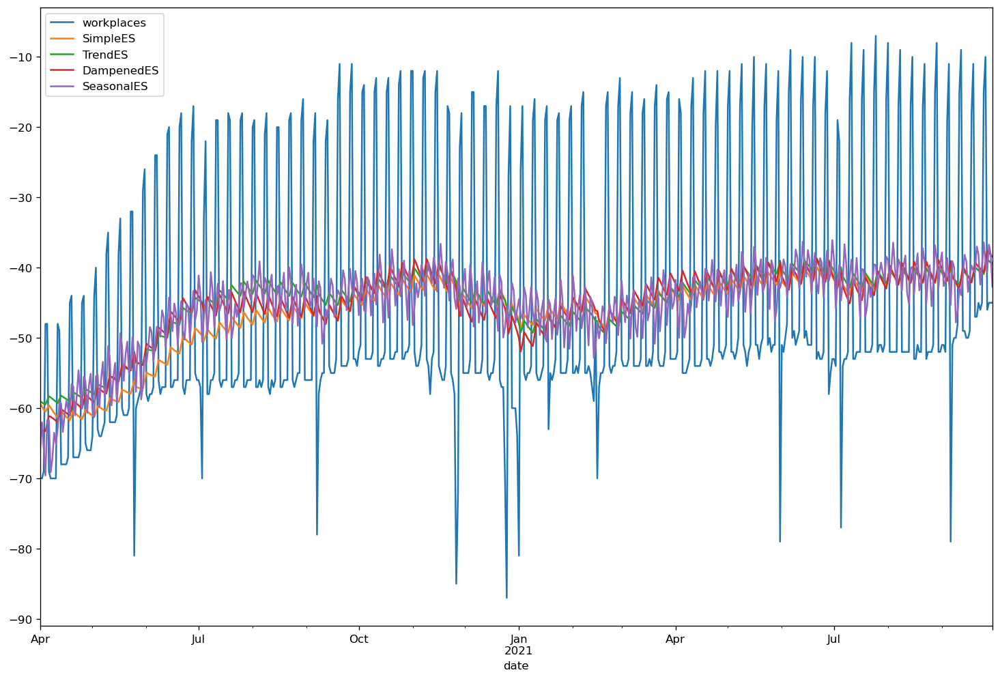

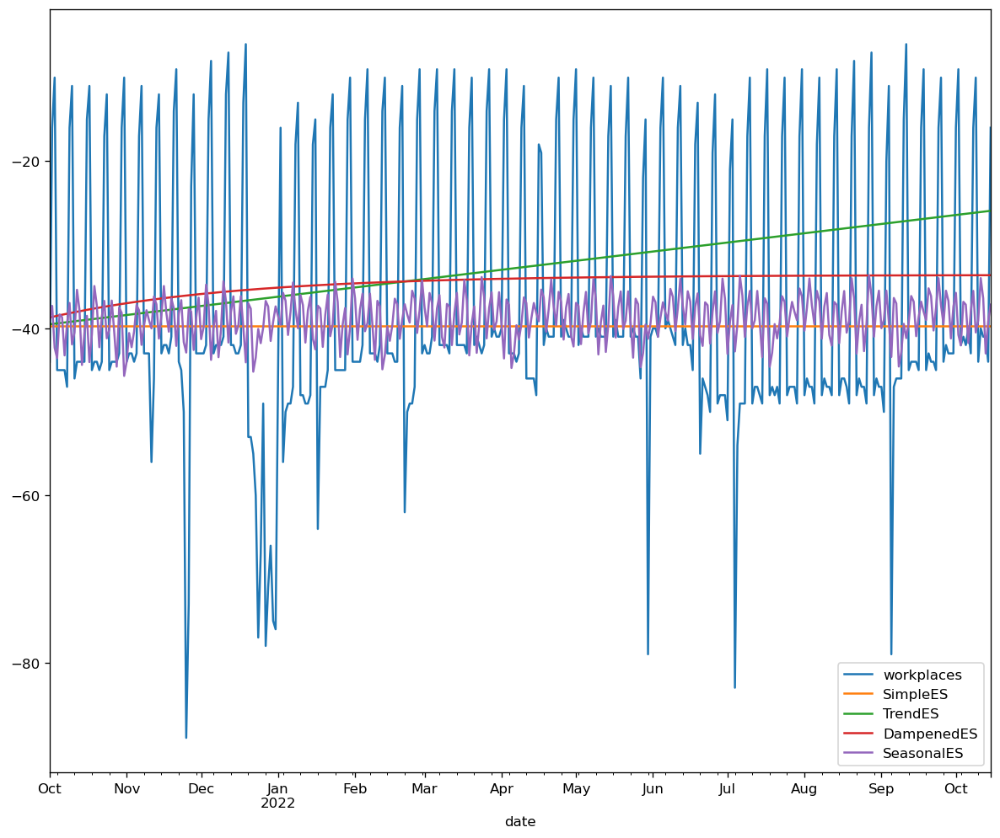

,ModelName,MAE,RMSE
0,SimpleES,11.924130,16.336946
1,TrendES,14.970740,16.970272
2,DampenedES,14.172387,16.292444
3,SeasonalES,12.450596,16.264576


In [ ]:
# 2. 
fit_model(df_training, df_test, "workplaces")

exp_smooth_scores = score_all_metrics(df_test, "workplaces", ["SimpleES","TrendES","DampenedES","SeasonalES"])

cm = sns.color_palette("vlag", as_cmap=True)
exp_smooth_scores.style.background_gradient(cmap=cm)

### SeasonalES is the best fit.

--------

### ARIMA

In [ ]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(df['workplaces'])
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
  print('\t%s: %.3f' % (key, value))

ADF Statistic: -3.668789
p-value: 0.004574
Critical Values:
	1%: -3.438
	5%: -2.865
	10%: -2.568


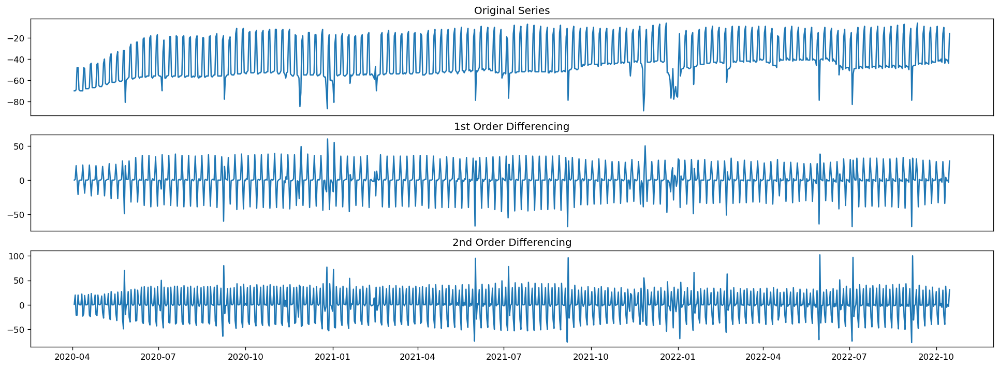

In [ ]:
# d=1
plt.rcParams.update({'figure.figsize':(20,7), 'figure.dpi':120})
# Original Series
fig, (ax1, ax2, ax3) = plt.subplots(3)
ax1.plot(df.workplaces); ax1.set_title('Original Series'); ax1.axes.xaxis.set_visible(False)
# 1st Differencing
ax2.plot(df.workplaces.diff()); ax2.set_title('1st Order Differencing'); ax2.axes.xaxis.set_visible(False)
# 2nd Differencing
ax3.plot(df.workplaces.diff().diff()); ax3.set_title('2nd Order Differencing')
plt.show()

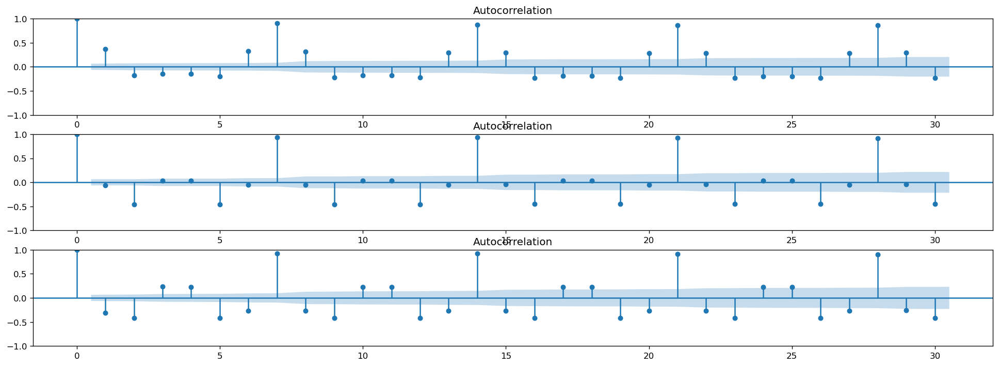

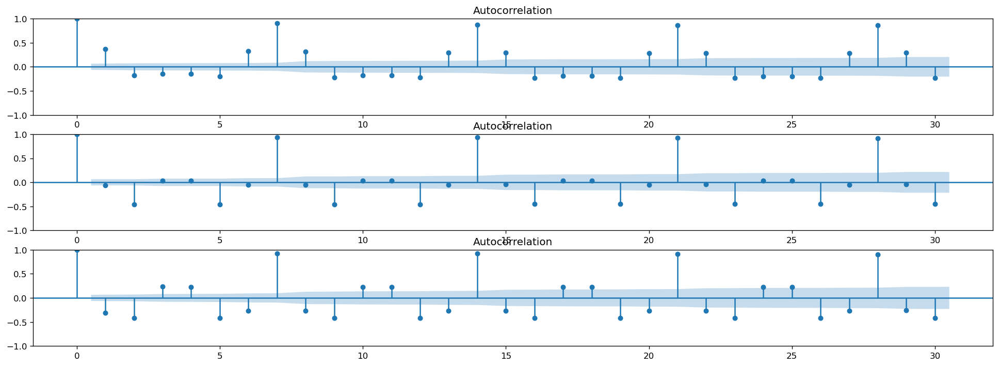

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
fig, (ax1, ax2, ax3) = plt.subplots(3)
plot_acf(df.workplaces, ax=ax1)
plot_acf(df.workplaces.diff().dropna(), ax=ax2)
plot_acf(df.workplaces.diff().diff().dropna(), ax=ax3)

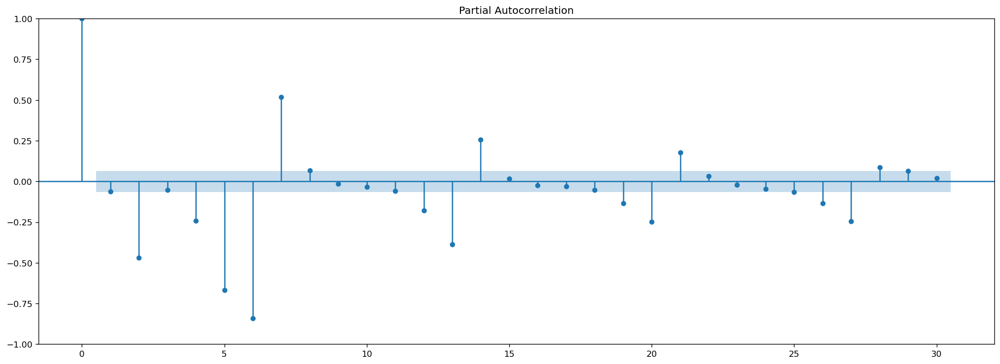

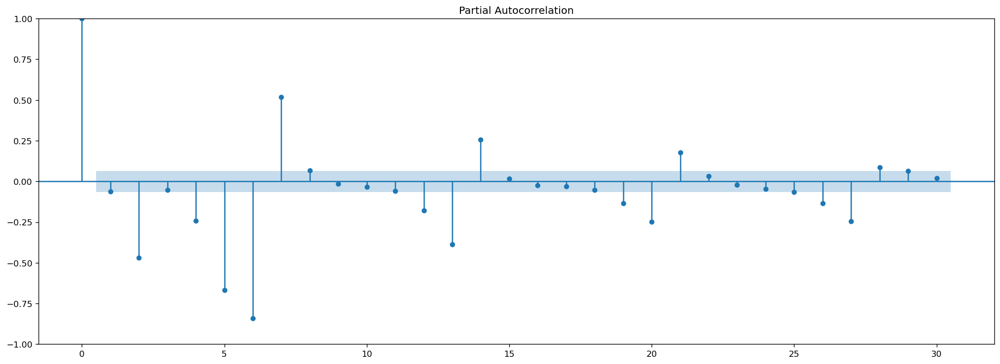

In [ ]:
from statsmodels.graphics.tsaplots import plot_pacf
# p=1
plot_pacf(df.workplaces.diff().dropna())


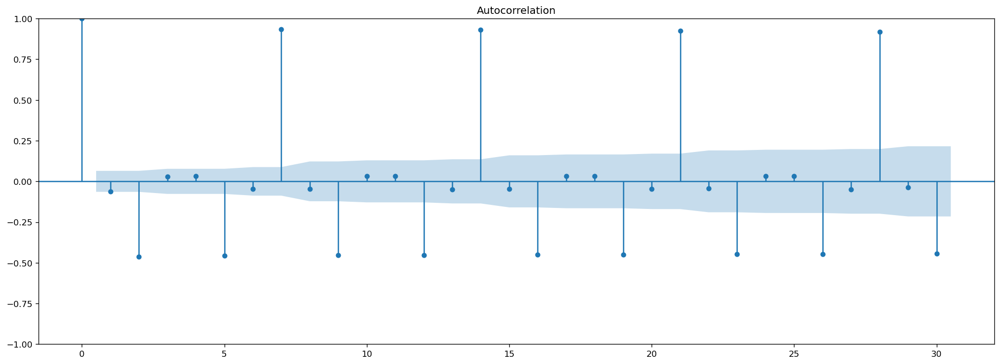

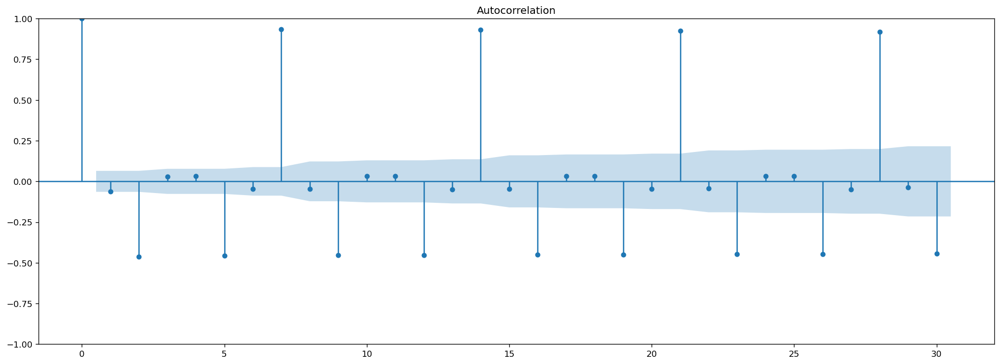

In [ ]:
# q=1
plot_acf(df.workplaces.diff().dropna())

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from pmdarima.arima import auto_arima

# AR(1)
ar_1 = ARIMA(df_training["workplaces"], order=(1,0,0))

# MA(1)
ma_1 = ARIMA(df_training["workplaces"], order=(0,0,1))

# ARIMA(1,1,1)
arima_1 = ARIMA(df_training["workplaces"], order=(1,1,1))

# S-ARIMA (1,1,1)(1,1,1,52)
sarima = ARIMA(df_training["workplaces"], order=(1,1,1), seasonal_order=(1,1,1,52))

# Add the values for each model
df_training["AR(1)"] = ar_1.fit().fittedvalues
df_training["MA(1)"] = ma_1.fit().fittedvalues
df_training["ARIMA(1,1,1)"] = arima_1.fit().fittedvalues
df_training["SARIMA(1,1,1)"] = sarima.fit().fittedvalues


df_test["AR(1)"] = ar_1.fit().forecast(n)
df_test["MA(1)"] = ma_1.fit().forecast(n)
df_test["ARIMA(1,1,1)"] = arima_1.fit().forecast(n)
df_test["SARIMA(1,1,1)"] = sarima.fit().forecast(n)



In [ ]:
arima_scores = score_all_metrics(df_test, "workplaces", ["AR(1)","MA(1)","ARIMA(1,1,1)","SARIMA(1,1,1)","SARIMAX(1,1,1)"])

cm = sns.color_palette("vlag", as_cmap=True)
arima_scores.style.background_gradient(cmap=cm)

,ModelName,MAE,RMSE
0,AR(1),11.929985,18.130773
1,MA(1),11.936118,18.134169
2,"ARIMA(1,1,1)",11.560649,16.531650
3,"SARIMA(1,1,1)",14.362114,16.476626
4,"SARIMAX(1,1,1)",44.065353,47.074394


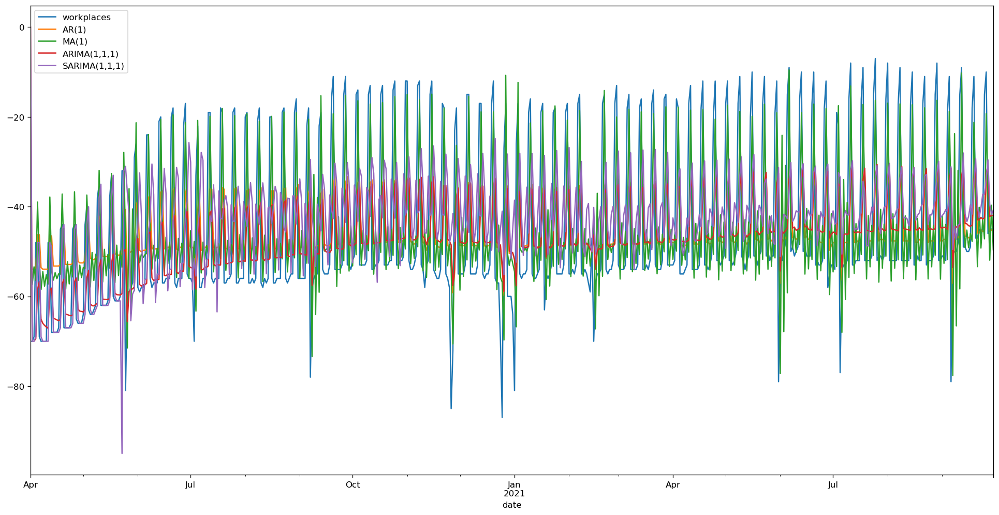

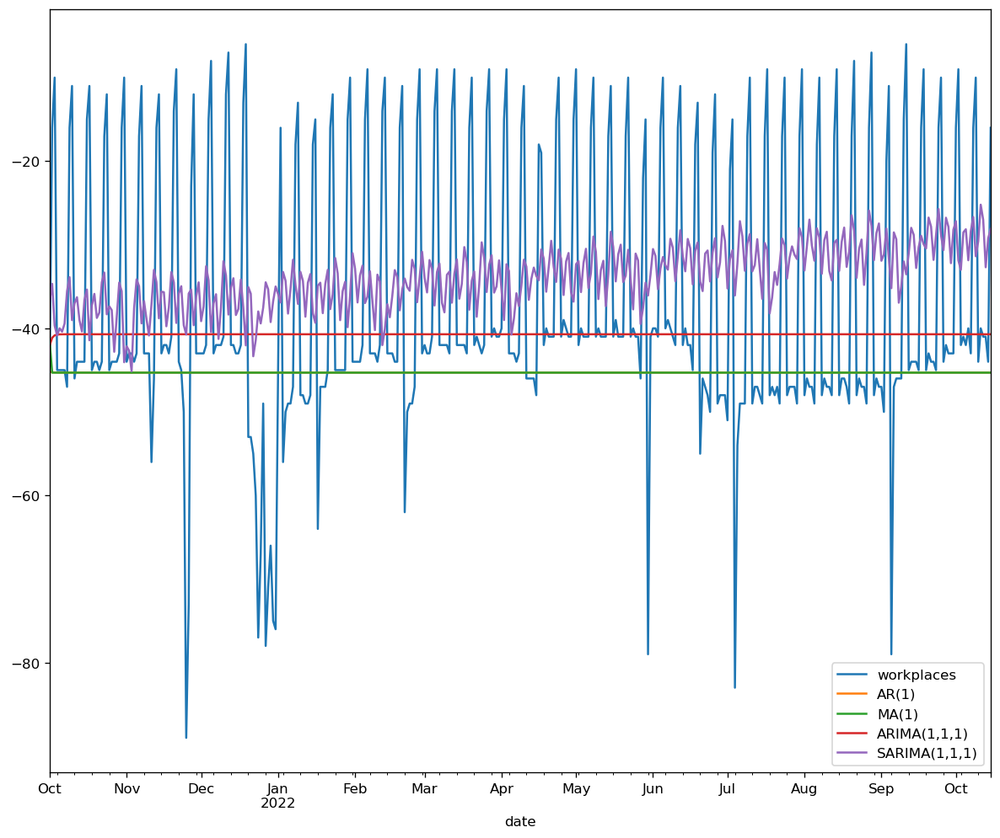

In [ ]:
df_training[["workplaces","AR(1)","MA(1)","ARIMA(1,1,1)","SARIMA(1,1,1)"]].plot(figsize=(20,10))
plt.show()

df_test[["workplaces","AR(1)","MA(1)","ARIMA(1,1,1)","SARIMA(1,1,1)"]].plot(figsize=(12,10))
plt.show()

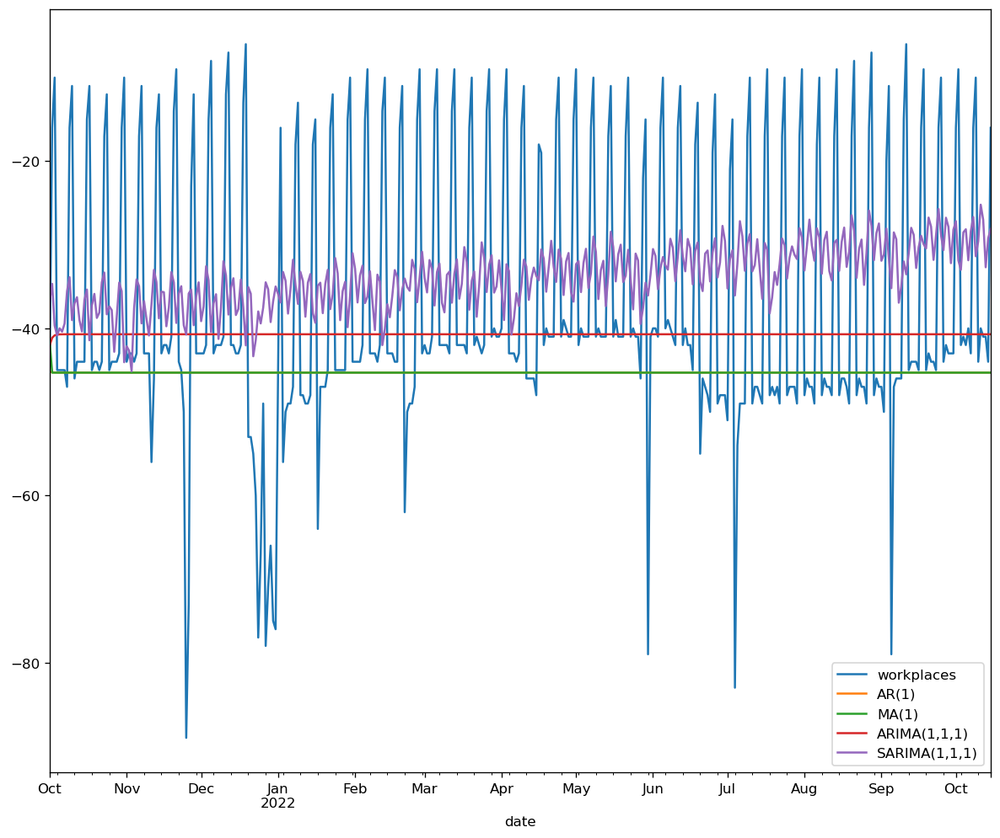

In [ ]:
df_test[["workplaces","AR(1)","MA(1)","ARIMA(1,1,1)","SARIMA(1,1,1)"]].plot(figsize=(12,10))
plt.show()

### seasonal ARIMA is the best fit in ARIMA.

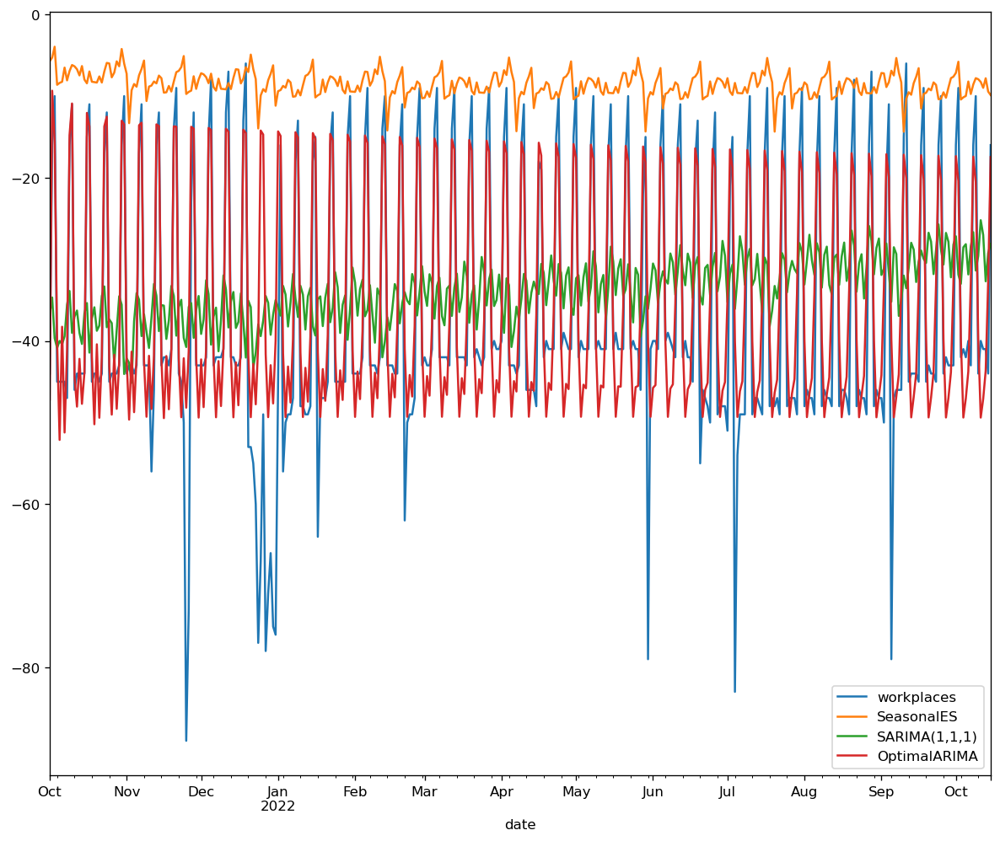

In [ ]:
# auto_arima breaks down my computer. So chose the above d p q in comparision
from pmdarima.arima import auto_arima
fit_model = auto_arima(df_training["workplaces"])
fit_model.get_params()
df_test["OptimalARIMA"] = fit_model.predict(n)
df_test[["workplaces","SeasonalES","SARIMA(1,1,1)", "OptimalARIMA"]].plot(figsize=(12,10))
plt.show()

In [ ]:
final_compare = score_all_metrics(df_test, "workplaces", ["SeasonalES","SARIMA(1,1,1)", "OptimalARIMA"])

cm = sns.color_palette("vlag", as_cmap=True)
final_compare.style.background_gradient(cmap=cm)

,ModelName,MAE,RMSE
0,SeasonalES,28.499386,32.650080
1,"SARIMA(1,1,1)",14.362114,16.476626
2,OptimalARIMA,5.821800,9.165654


### OptimalARIMA is the best fit in all models.

--------

## predict 2022

In [ ]:
print(df)

In [ ]:
df["OptimalARIMA"] = fit_model.predict(m)
df_test[["workplaces","OptimalARIMA"]].plot(figsize=(12,10))
plt.show()

### 3. grocery_and_pharmacy

### ES

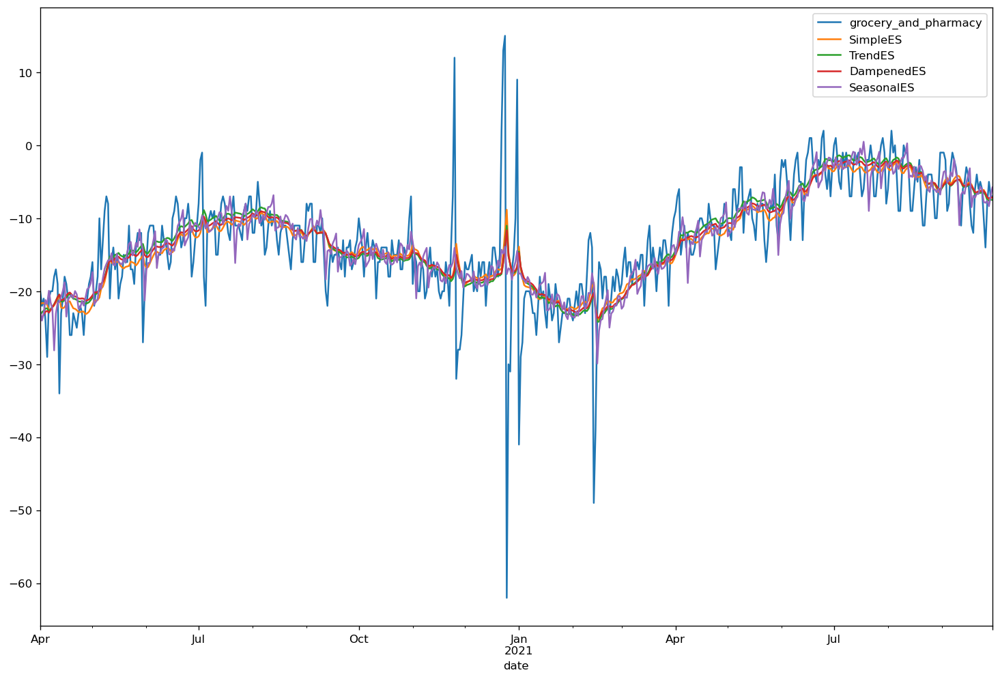

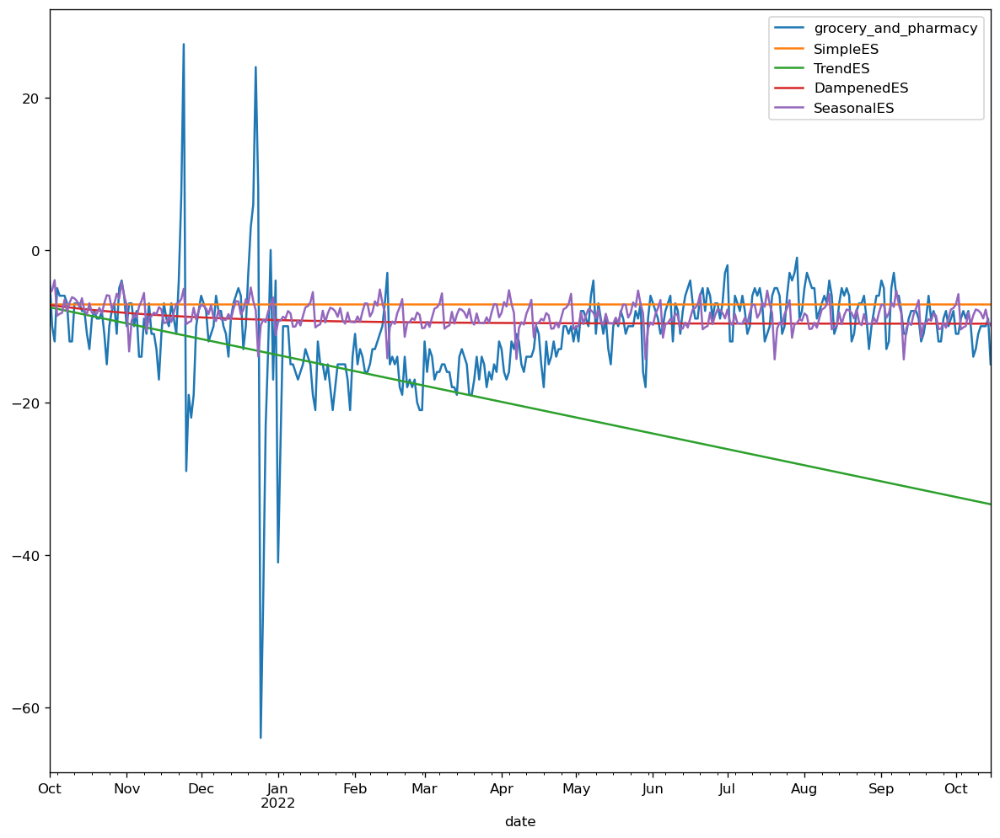

,ModelName,MAE,RMSE
0,SimpleES,4.928267,7.388541
1,TrendES,11.302111,14.518889
2,DampenedES,4.208680,6.632343
3,SeasonalES,4.417428,6.838108


In [ ]:
# 3. 
fit_model(df_training, df_test, "grocery_and_pharmacy")

exp_smooth_scores = score_all_metrics(df_test, "grocery_and_pharmacy", ["SimpleES","TrendES","DampenedES","SeasonalES"])

cm = sns.color_palette("vlag", as_cmap=True)
exp_smooth_scores.style.background_gradient(cmap=cm)

### SeasonalES is the best fit.

--------

### ARIMA

In [ ]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(df['grocery_and_pharmacy'])
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
  print('\t%s: %.3f' % (key, value))

ADF Statistic: -2.751250
p-value: 0.065582
Critical Values:
	1%: -3.438
	5%: -2.865
	10%: -2.568


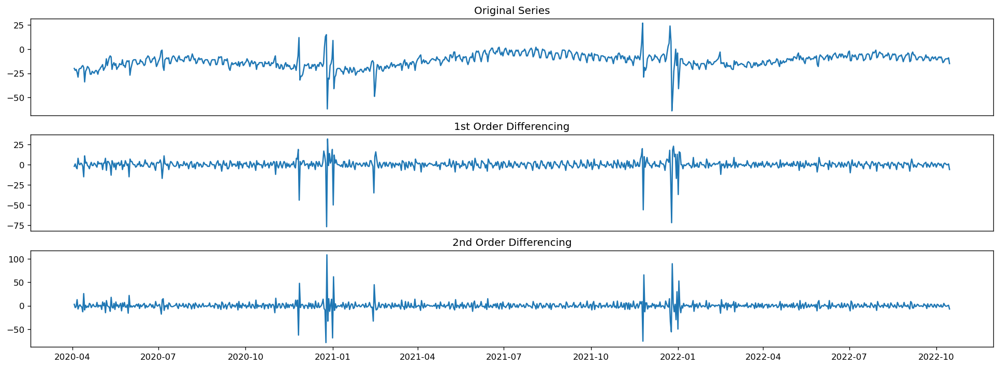

In [ ]:
# d=1
plt.rcParams.update({'figure.figsize':(20,7), 'figure.dpi':120})
# Original Series
fig, (ax1, ax2, ax3) = plt.subplots(3)
ax1.plot(df.grocery_and_pharmacy); ax1.set_title('Original Series'); ax1.axes.xaxis.set_visible(False)
# 1st Differencing
ax2.plot(df.grocery_and_pharmacy.diff()); ax2.set_title('1st Order Differencing'); ax2.axes.xaxis.set_visible(False)
# 2nd Differencing
ax3.plot(df.grocery_and_pharmacy.diff().diff()); ax3.set_title('2nd Order Differencing')
plt.show()

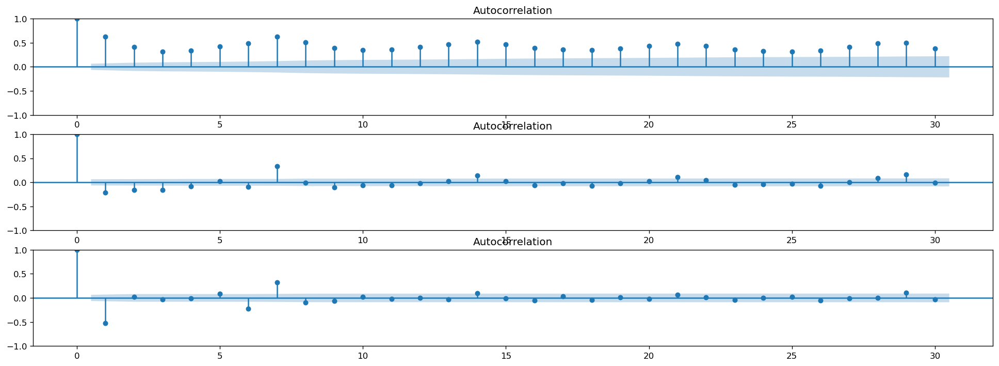

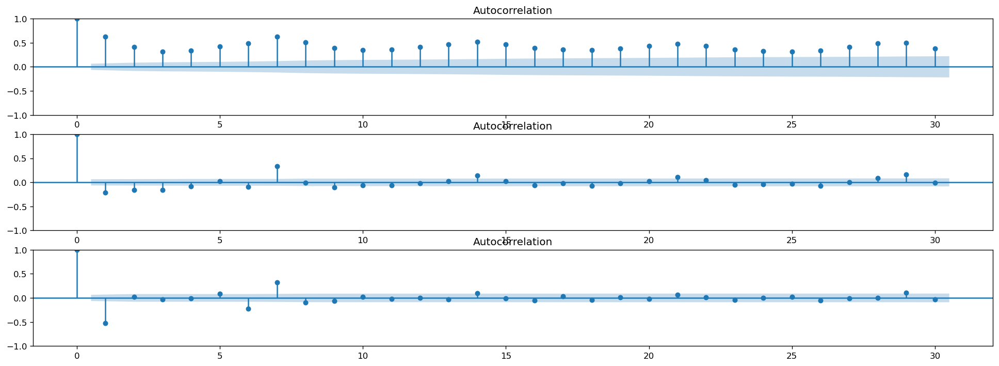

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
fig, (ax1, ax2, ax3) = plt.subplots(3)
plot_acf(df.grocery_and_pharmacy, ax=ax1)
plot_acf(df.grocery_and_pharmacy.diff().dropna(), ax=ax2)
plot_acf(df.grocery_and_pharmacy.diff().diff().dropna(), ax=ax3)

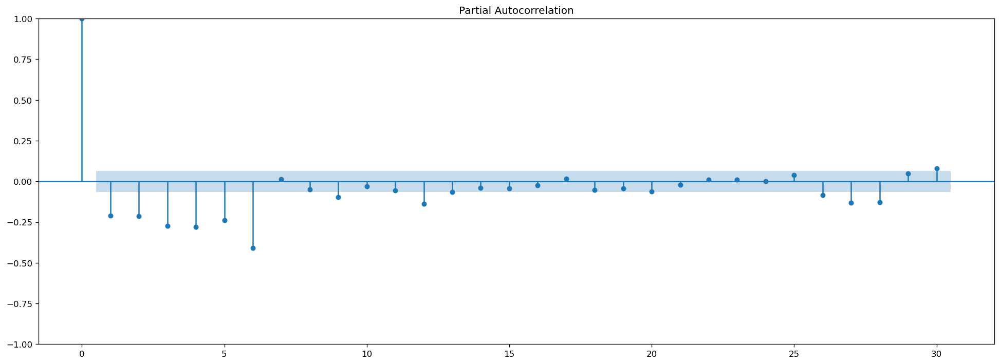

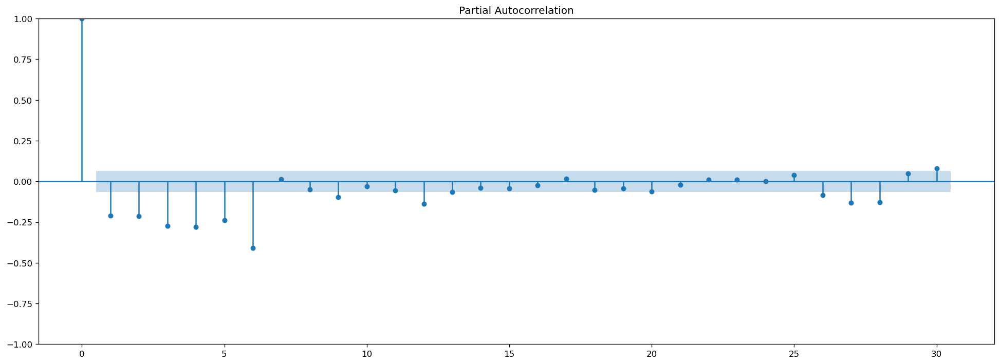

In [ ]:
from statsmodels.graphics.tsaplots import plot_pacf
# p=1
plot_pacf(df.grocery_and_pharmacy.diff().dropna())


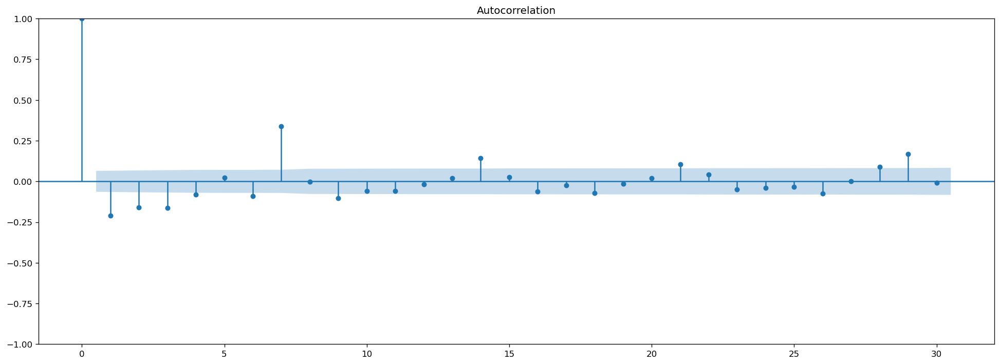

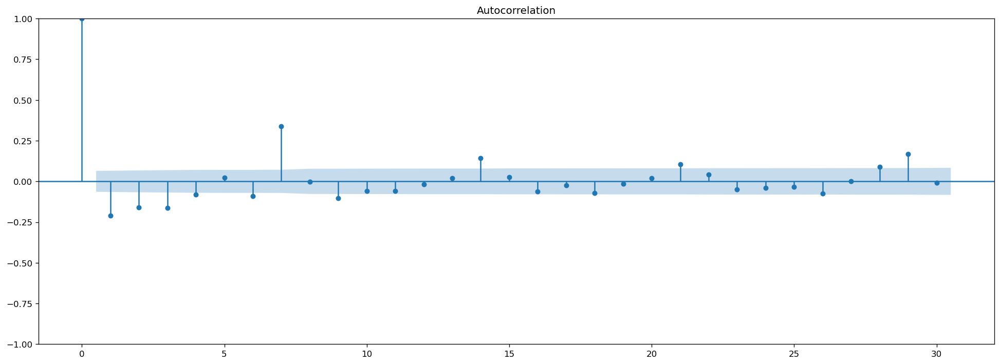

In [ ]:
# q=1
plot_acf(df.grocery_and_pharmacy.diff().dropna())

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from pmdarima.arima import auto_arima

# AR(1)
ar_1 = ARIMA(df_training["grocery_and_pharmacy"], order=(1,0,0))

# MA(1)
ma_1 = ARIMA(df_training["grocery_and_pharmacy"], order=(0,0,1))

# ARIMA(1,1,1)
arima_1 = ARIMA(df_training["grocery_and_pharmacy"], order=(1,1,1))

# S-ARIMA (1,1,1)(1,1,1,52)
sarima = ARIMA(df_training["grocery_and_pharmacy"], order=(1,1,1), seasonal_order=(1,1,1,52))

# Add the values for each model
df_training["AR(1)"] = ar_1.fit().fittedvalues
df_training["MA(1)"] = ma_1.fit().fittedvalues
df_training["ARIMA(1,1,1)"] = arima_1.fit().fittedvalues
df_training["SARIMA(1,1,1)"] = sarima.fit().fittedvalues


df_test["AR(1)"] = ar_1.fit().forecast(n)
df_test["MA(1)"] = ma_1.fit().forecast(n)
df_test["ARIMA(1,1,1)"] = arima_1.fit().forecast(n)
df_test["SARIMA(1,1,1)"] = sarima.fit().forecast(n)



In [ ]:
arima_scores = score_all_metrics(df_test, "grocery_and_pharmacy", ["AR(1)","MA(1)","ARIMA(1,1,1)","SARIMA(1,1,1)","SARIMAX(1,1,1)"])

cm = sns.color_palette("vlag", as_cmap=True)
arima_scores.style.background_gradient(cmap=cm)

,ModelName,MAE,RMSE
0,AR(1),4.744211,6.869880
1,MA(1),4.766195,6.884711
2,"ARIMA(1,1,1)",5.118656,7.557468
3,"SARIMA(1,1,1)",11.003441,12.418366
4,"SARIMAX(1,1,1)",17.910530,19.166799


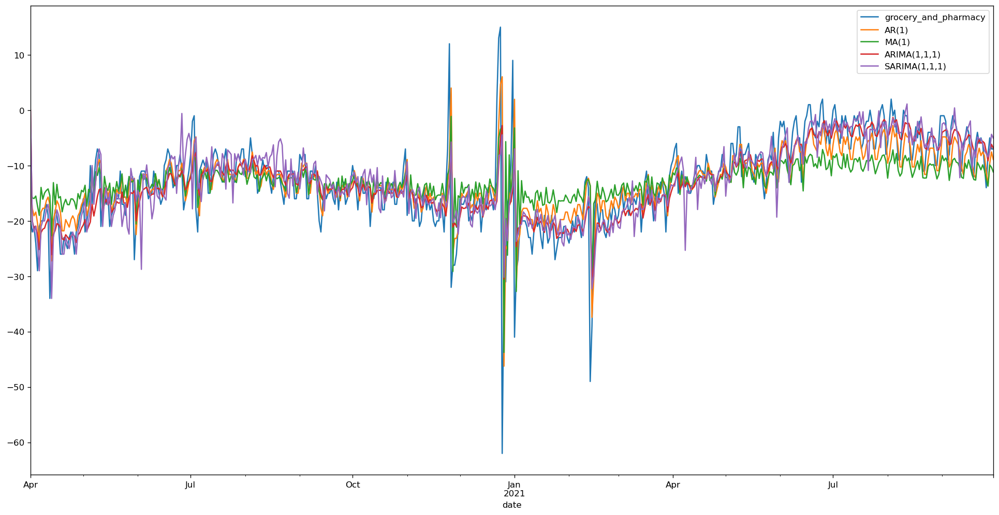

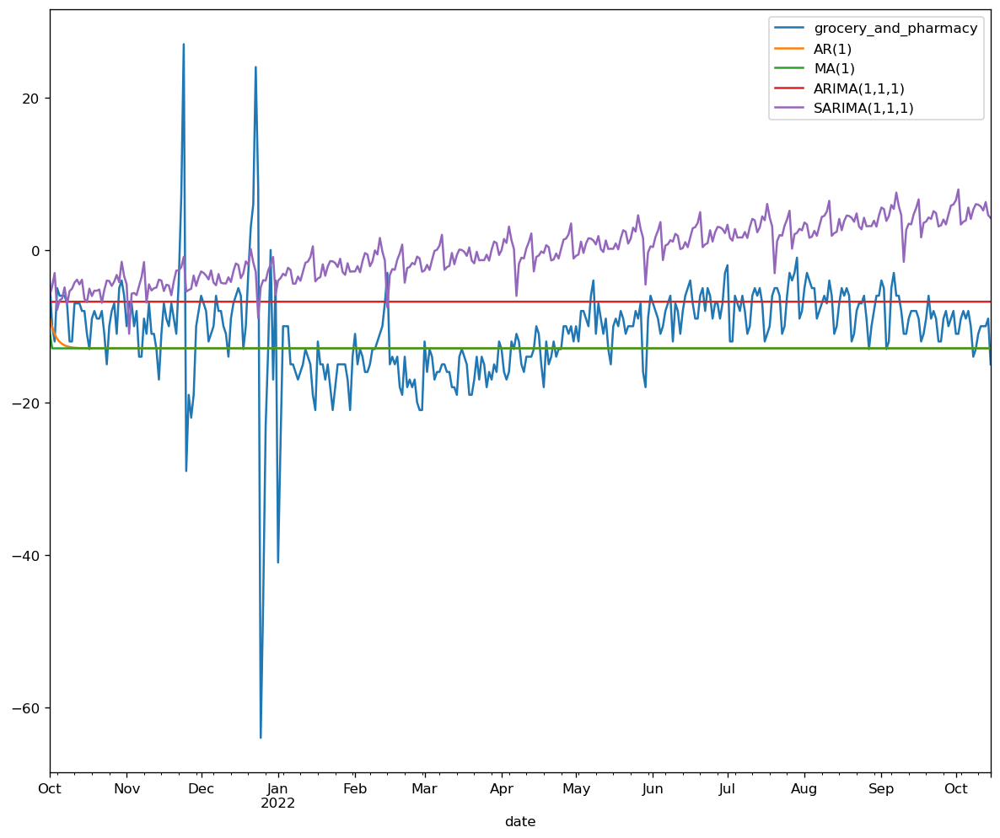

In [ ]:
df_training[["grocery_and_pharmacy","AR(1)","MA(1)","ARIMA(1,1,1)","SARIMA(1,1,1)"]].plot(figsize=(20,10))
plt.show()

df_test[["grocery_and_pharmacy","AR(1)","MA(1)","ARIMA(1,1,1)","SARIMA(1,1,1)"]].plot(figsize=(12,10))
plt.show()

### seasonal ARIMA is the best fit in ARIMA.

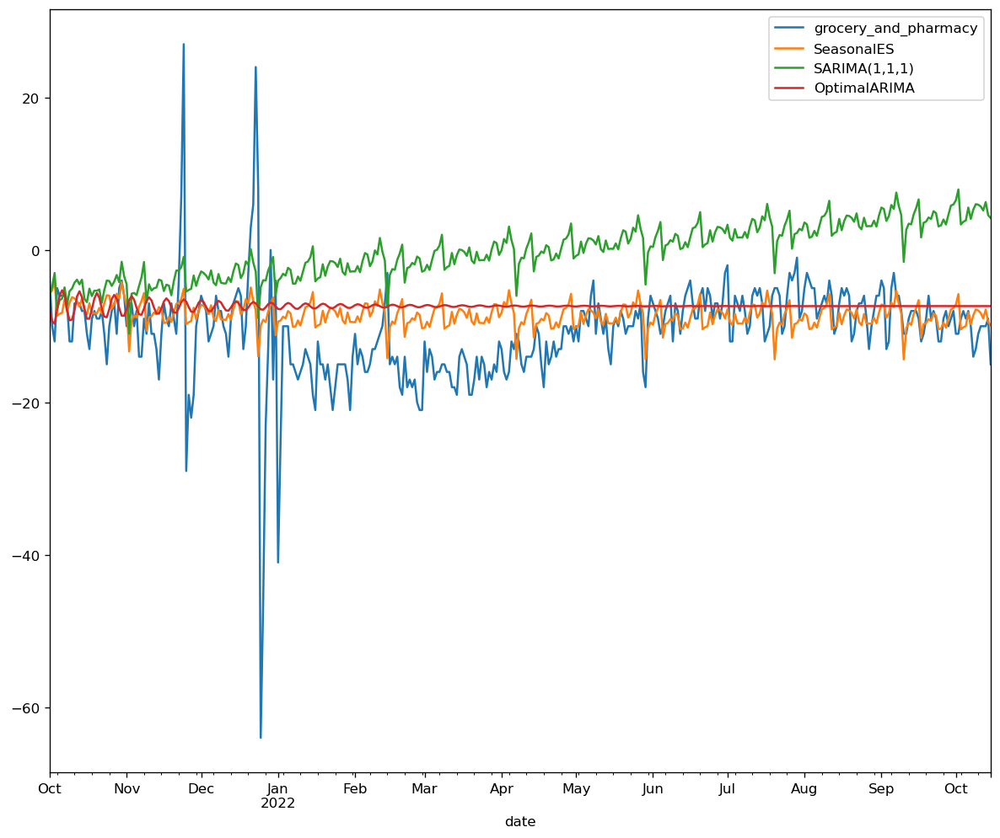

In [ ]:
# auto_arima breaks down my computer. So chose the above d p q in comparision
from pmdarima.arima import auto_arima
fit_model = auto_arima(df_training["grocery_and_pharmacy"])
fit_model.get_params()
df_test["OptimalARIMA"] = fit_model.predict(n)
df_test[["grocery_and_pharmacy","SeasonalES","SARIMA(1,1,1)", "OptimalARIMA"]].plot(figsize=(12,10))
plt.show()

In [ ]:
final_compare = score_all_metrics(df_test, "grocery_and_pharmacy", ["SeasonalES","SARIMA(1,1,1)", "OptimalARIMA"])

cm = sns.color_palette("vlag", as_cmap=True)
final_compare.style.background_gradient(cmap=cm)

,ModelName,MAE,RMSE
0,SeasonalES,4.417428,6.838108
1,"SARIMA(1,1,1)",11.003441,12.418366
2,OptimalARIMA,4.778993,7.205637


### SeasonalES is the best fit in all models.

--------

## predict 2022

In [ ]:
fit_model(df_training, df_test, "grocery_and_pharmacy")

exp_smooth_scores = score_all_metrics(df, "grocery_and_pharmacy", ["SeasonalES"])

cm = sns.color_palette("vlag", as_cmap=True)
exp_smooth_scores.style.background_gradient(cmap=cm)